In [1]:
import pandas as pd
import geopandas as gpd
import folium
import matplotlib.pyplot as plt
import contextily as ctx
import requests
from shapely.geometry import Point, Polygon
from datetime import datetime
from tqdm import tqdm
import time
from collections import defaultdict
import seaborn as sns
from prophet import Prophet
from scipy.optimize import curve_fit
import numpy as n
from scipy.interpolate import CubicSpline
import itertools
from prophet.diagnostics import cross_validation, performance_metrics
import pickle
from scipy.stats import linregress
import numpy as np
from sklearn.cluster import KMeans
from pykrige.ok import OrdinaryKriging
from pyproj import Transformer
import matplotlib as mpl
from scipy import stats

/Users/nicross/opt/anaconda3/envs/py310/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
central = pd.read_csv("../data/central_stations_observations.csv")

In [3]:
central["min_2014_2024"] = central[[f'observations_{year}' for year in range(2014, 2025)]].min(axis=1)

In [4]:
central_ov25 = central[central.min_2014_2024 > 25].copy()

In [5]:
def fetch_all_records(site_code, year):
    all_records = []
    offset = 0
    limit = 1000
    while True:
        url = f"https://data.cnra.ca.gov/api/3/action/datastore_search?resource_id=bfa9f262-24a1-45bd-8dc8-138bc8107266&q={site_code} {year}&limit={limit}&offset={offset}"
        response = requests.get(url)
        if response.status_code == 200:
            data = response.json()
            records = data['result']['records']
            all_records.extend(records)
            if len(records) < limit:
                break
            offset += limit
        else:
            print(f"Failed to fetch data for {site_code} in {year}")
            break
    return all_records

def get_readings_for_site(site_code, years):
    all_readings = []
    for year in tqdm(years, desc=f"Fetching data for {site_code}"):
        records = fetch_all_records(site_code, year)
        for record in records:
            reading = {
                'site_code': record.get('site_code'),
                'msmt_date': record.get('msmt_date'),
                'wlm_rpe': record.get('wlm_rpe'),
                'wlm_gse': record.get('wlm_gse'),
                'gwe': record.get('gwe')
            }
            all_readings.append(reading)
    return pd.DataFrame(all_readings)

In [6]:
def interpolate_gwe(site_code, years, readings_df):
    site_data = readings_df
    site_data.rename(columns={"msmt_date": "ds", "gwe": "y"}, inplace=True)
    site_data['ds'] = pd.to_datetime(site_data['ds'])

    full_date_range = pd.date_range(start=f"{min(years)}-01-01", end=f"{max(years)}-12-31", freq="D")
    full_df = pd.DataFrame({'ds': full_date_range})
    full_df = full_df.merge(site_data, on='ds', how='left')

    m = Prophet(
        changepoint_prior_scale=0.01,
        seasonality_prior_scale=0.01,
        yearly_seasonality=True
    )
    m.fit(site_data.dropna())

    forecast = m.predict(full_df)

    full_df['y_interpolated'] = forecast['yhat']

    result_df = full_df[['ds', 'y_interpolated']].copy()
    result_df.rename(columns={"ds": "date", "y_interpolated": "gwe_interpolated"}, inplace=True)

    return result_df

In [7]:
def gwe_10y(site_code, start_yr):
    years = [start_yr + i for i in range(0, 11)]
    readings_df = get_readings_for_site(site_code, years)
    predicted = interpolate_gwe(site_code, years, readings_df)

    predicted['date'] = pd.to_datetime(predicted['date'])
    predicted.set_index('date', inplace=True)

    monthly_avg = predicted.resample('ME').mean()
    
    return monthly_avg

In [8]:
well_gwe_monthly = pd.read_pickle("../data/well_gwe_monthly.pkl")

In [9]:
def get_precipitation_data(latitude, longitude, start_date, end_date, parameter="PRECTOTCORR"):
    base_url = "https://power.larc.nasa.gov/api/temporal/daily/point"
    
    params = {
        "parameters": parameter,
        "community": "AG",
        "longitude": longitude,
        "latitude": latitude,
        "start": start_date,
        "end": end_date,
        "format": "JSON"
    }

    response = requests.get(base_url, params=params)
    response.raise_for_status()

    data = response.json()

    try:
        precip_data = data["properties"]["parameter"][parameter]
    except KeyError as e:
        raise ValueError(f"Unable to retrieve parameter '{parameter}' from response: {e}")

    return precip_data

In [10]:
well_gwe_monthly.get("404614N1222443W001")

,gwe_interpolated
date,
2014-01-31,380.663687
2014-02-28,381.782082
2014-03-31,381.805231
2014-04-30,381.870860
2014-05-31,382.607756
...,...
2024-08-31,385.727453
2024-09-30,385.536266
2024-10-31,385.620144


In [13]:
def calculate_groundwater_changes(data_dict):
    result_dict = {}
    for year in range(2014, 2024):
        year_dict = {}

        for site_code, df in data_dict.items():
            try:
                october_value = df.loc[f'{year}-10-31'].iloc[0]
                september_value = df.loc[f'{year+1}-09-30'].iloc[0]
                change = october_value - september_value
                year_dict[site_code] = change
            except KeyError:
                print(f"Warning: Missing data for site {site_code} in year {year} or {year+1}.")
                year_dict[site_code] = None

        result_dict[year] = year_dict

    return result_dict

In [14]:
changes = calculate_groundwater_changes(well_gwe_monthly)

In [15]:
central_ov25.head()

,site_code,latitude,longitude,well_depth,well_use,geology,Region_Off,Basin_Subb,observations_2010,observations_2011,...,observations_2016,observations_2017,observations_2018,observations_2019,observations_2020,observations_2021,observations_2022,observations_2023,observations_2024,min_2014_2024
3750,384159N1217303W001,38.41590,-121.73030,43.0,Observation,['Q'],NCRO,5-021.66,391,384,...,325,385,381,292,380,384,384,378,257,229
3751,384159N1217303W002,38.41585,-121.73034,243.0,Observation,['Q'],NCRO,5-021.66,306,358,...,382,385,381,292,380,384,384,269,197,197
3752,384159N1217303W003,38.41590,-121.73030,445.0,Observation,['Q'],NCRO,5-021.66,364,384,...,382,385,381,292,380,384,384,378,197,112
4014,386062N1215602W001,38.60620,-121.56020,100.0,Observation,['Q'],NCRO,5-021.67,2,0,...,289,299,164,371,370,372,370,361,324,164
4015,386062N1215602W002,38.60620,-121.56020,170.0,Observation,['Q'],NCRO,5-021.67,2,0,...,261,299,310,369,370,372,370,365,324,216


In [16]:
def process_precipitation_data(precip_data):
    df = pd.DataFrame.from_dict(precip_data, orient="index", columns=["precipitation"])
    df.index = pd.to_datetime(df.index)
    monthly_avg = df.resample("ME").mean()
    
    return monthly_avg

def get_monthly_precipitation_for_sites(central_ov25, start_date=2014, end_date=2024):
    result_dict = {}

    for index, row in tqdm(central_ov25.iterrows(), total=len(central_ov25), desc="Processing sites"):
        site_code = row["site_code"]
        latitude = row["latitude"]
        longitude = row["longitude"]

        try:
            precip_data = get_precipitation_data(latitude, longitude, start_date, end_date)
            monthly_avg = process_precipitation_data(precip_data)
            result_dict[site_code] = monthly_avg

        except Exception as e:
            print(f"Error processing site {site_code}: {e}")
            result_dict[site_code] = None

    return result_dict

In [17]:
precipitation_data = get_monthly_precipitation_for_sites(central_ov25)

Processing sites: 100%|███████████████████████| 298/298 [06:56<00:00,  1.40s/it]


In [18]:
precipitation_data.get("384159N1217303W001")

,precipitation
2014-01-31,0.213871
2014-02-28,5.565714
2014-03-31,2.186129
2014-04-30,1.225667
2014-05-31,0.068710
...,...
2024-08-31,0.041935
2024-09-30,0.001667
2024-10-31,0.216129
2024-11-30,7.461333


In [19]:
def calculate_annual_precipitation_averages(precipitation_dict):
    result_dict = {}
    for year in range(2014, 2024):
        year_dict = {}
        for site_code, monthly_avg in precipitation_dict.items():
            if monthly_avg is not None:
                try:
                    start_date = f"{year}-10-31"
                    end_date = f"{year+1}-09-30"
                    period_data = monthly_avg.loc[start_date:end_date]
                    average_precip = period_data["precipitation"].mean()
                    year_dict[site_code] = average_precip
                except KeyError:
                    print(f"Warning: Missing data for site {site_code} in year {year}.")
                    year_dict[site_code] = None
        result_dict[year] = year_dict
    return result_dict

In [20]:
well_precipitation = calculate_annual_precipitation_averages(precipitation_data)

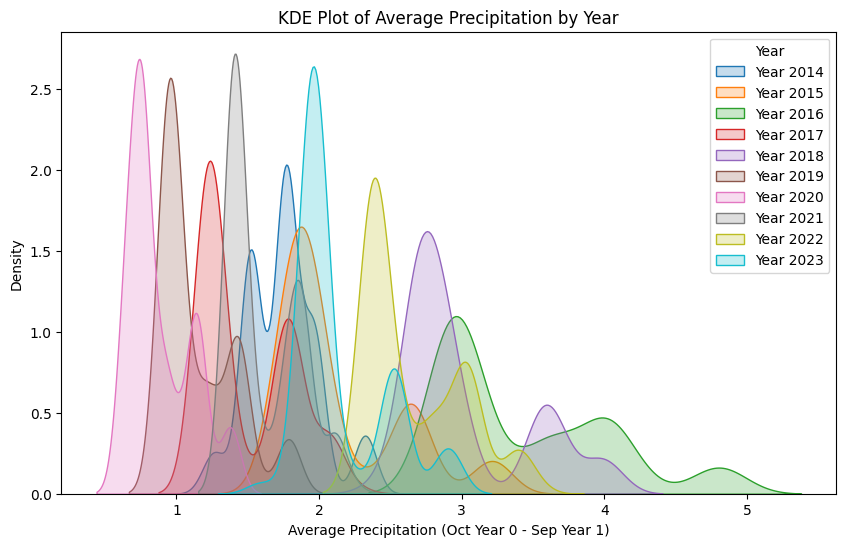

In [21]:
data = []
for year, site_data in well_precipitation.items():
    for site_code, avg_precip in site_data.items():
        data.append({"year": year, "site_code": site_code, "average_precipitation": avg_precip})

df = pd.DataFrame(data)

plt.figure(figsize=(10, 6))
for year in df["year"].unique():
    sns.kdeplot(
        df[df["year"] == year]["average_precipitation"],
        label=f"Year {year}",
        fill=True
    )

plt.xlabel("Average Precipitation (Oct Year 0 - Sep Year 1)")
plt.ylabel("Density")
plt.title("KDE Plot of Average Precipitation by Year")
plt.legend(title="Year")

plt.show()

In [22]:
def filter_middle_95_by_year(df):
    filtered_data = []
    for year, group in df.groupby("year"):
        lower_threshold = np.percentile(group["average_precipitation"], 2.5)
        upper_threshold = np.percentile(group["average_precipitation"], 97.5)
        filtered_group = group[
            (group["average_precipitation"] >= lower_threshold) &
            (group["average_precipitation"] <= upper_threshold)
        ]
        filtered_data.append(filtered_group)
    return pd.concat(filtered_data)

In [23]:
filtered_rain = filter_middle_95_by_year(df)

In [24]:
filtered_rain.head()

,year,site_code,average_precipitation
0,2014,384159N1217303W001,1.276127
1,2014,384159N1217303W002,1.276127
2,2014,384159N1217303W003,1.276127
5,2014,386464N1216675W002,1.276127
6,2014,386464N1216675W003,1.276127


In [25]:
precip_year_stats = filtered_rain[["year", "average_precipitation"]].groupby("year").agg(
    mean_precipitation=('average_precipitation', 'mean'),
    variance_precipitation=('average_precipitation', 'var')
)

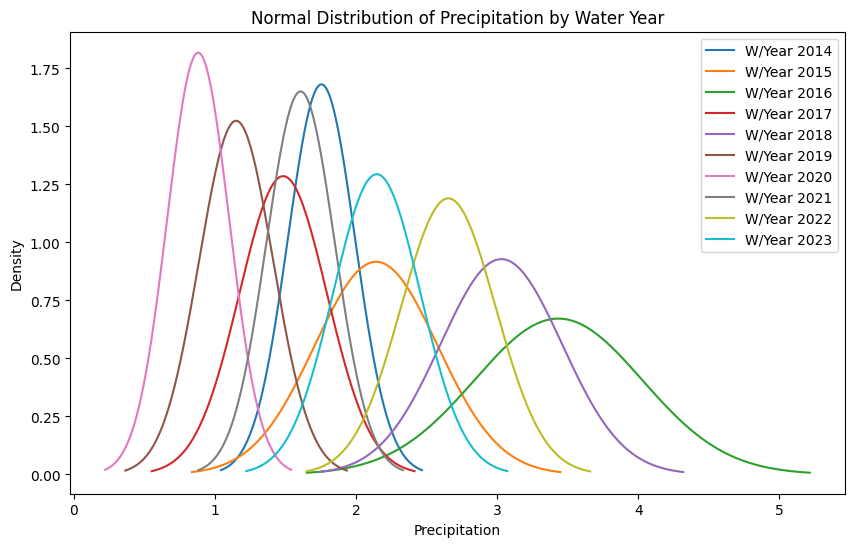

In [26]:
plt.figure(figsize=(10, 6))

for year, row in precip_year_stats.iterrows():
    mean = row['mean_precipitation']
    variance = row['variance_precipitation']
    std_dev = np.sqrt(variance)
    x = np.linspace(mean - 3 * std_dev, mean + 3 * std_dev, 1000)
    y = (1 / (std_dev * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((x - mean) / std_dev) ** 2)
    sns.lineplot(x=x, y=y, label=f'W/Year {year}')

plt.xlabel('Precipitation')
plt.ylabel('Density')
plt.title('Normal Distribution of Precipitation by Water Year')
plt.legend()
plt.show()

In [27]:
precip_year_stats["wet/dry"] = np.where(precip_year_stats['mean_precipitation'] > 2, 'wet', 'dry')

In [28]:
precip_year_stats

,mean_precipitation,variance_precipitation,wet/dry
year,,,
2014,1.754826,0.056295,dry
2015,2.142250,0.189446,wet
2016,3.433437,0.352716,wet
2017,1.483571,0.096272,dry
2018,3.029112,0.184773,wet
2019,1.150101,0.068488,dry
2020,0.881286,0.048165,dry
2021,1.606905,0.058399,dry
2022,2.653636,0.112359,wet


In [29]:
wet_years = precip_year_stats[precip_year_stats['wet/dry'] == 'wet'].index.tolist()
dry_years = precip_year_stats[precip_year_stats['wet/dry'] == 'dry'].index.tolist()

wet_gwe_sum = {}
dry_gwe_sum = {}
wet_gwe_count = {}
dry_gwe_count = {}

for year, site_changes in changes.items():
    if year in wet_years:
        for site_code, change in site_changes.items():
            if site_code in wet_gwe_sum:
                wet_gwe_sum[site_code] += change
                wet_gwe_count[site_code] += 1
            else:
                wet_gwe_sum[site_code] = change
                wet_gwe_count[site_code] = 1
    elif year in dry_years:
        for site_code, change in site_changes.items():
            if site_code in dry_gwe_sum:
                dry_gwe_sum[site_code] += change
                dry_gwe_count[site_code] += 1
            else:
                dry_gwe_sum[site_code] = change
                dry_gwe_count[site_code] = 1

wet_gwe_avg = {site_code: wet_gwe_sum[site_code] / wet_gwe_count[site_code] for site_code in wet_gwe_sum}
dry_gwe_avg = {site_code: dry_gwe_sum[site_code] / dry_gwe_count[site_code] for site_code in dry_gwe_sum}

central_ov25['wet_avg_gwe'] = central_ov25['site_code'].map(wet_gwe_avg)
central_ov25['dry_avg_gwe'] = central_ov25['site_code'].map(dry_gwe_avg)

In [30]:
central_ov25.describe()

,latitude,longitude,well_depth,observations_2010,observations_2011,observations_2012,observations_2013,observations_2014,observations_2015,observations_2016,...,observations_2018,observations_2019,observations_2020,observations_2021,observations_2022,observations_2023,observations_2024,min_2014_2024,wet_avg_gwe,dry_avg_gwe
count,298.000000,298.000000,298.000000,298.000000,298.000000,298.000000,298.000000,298.000000,298.000000,298.000000,...,298.000000,298.000000,298.000000,298.000000,298.000000,298.000000,298.000000,298.000000,298.000000,298.000000
mean,39.465001,-121.857009,430.204698,250.211409,302.204698,336.912752,347.543624,331.442953,323.828859,318.500000,...,329.251678,334.590604,325.016779,340.382550,333.278523,328.657718,283.949664,199.120805,-1.875939,5.484235
std,0.469736,0.336123,320.703533,138.669115,117.207700,83.386321,57.841125,89.137270,91.045226,93.330059,...,87.260439,79.297336,94.596768,92.696935,113.847495,83.667554,86.896011,91.620459,3.953778,5.766752
min,38.415850,-122.333850,7.000000,0.000000,0.000000,0.000000,3.000000,28.000000,37.000000,31.000000,...,47.000000,45.000000,51.000000,52.000000,52.000000,51.000000,46.000000,28.000000,-20.903848,-16.649131
25%,39.024430,-122.102000,173.500000,136.000000,276.000000,364.000000,363.250000,365.000000,297.000000,296.000000,...,335.500000,356.000000,331.000000,322.250000,320.000000,319.250000,251.000000,128.750000,-3.350117,1.658202
50%,39.554545,-121.913900,326.000000,299.500000,367.000000,368.000000,368.000000,368.000000,368.000000,367.000000,...,368.000000,368.000000,369.000000,368.000000,368.000000,367.000000,299.000000,197.500000,-1.639954,4.440550
75%,39.783560,-121.655050,668.500000,368.000000,370.000000,370.000000,373.000000,371.000000,371.750000,371.000000,...,370.000000,368.000000,370.000000,373.000000,373.000000,369.000000,347.500000,285.000000,-0.115238,8.367428
max,40.470520,-120.471740,1350.000000,391.000000,384.000000,379.000000,393.000000,400.000000,425.000000,425.000000,...,425.000000,423.000000,429.000000,488.000000,756.000000,380.000000,382.000000,368.000000,17.790886,25.516934


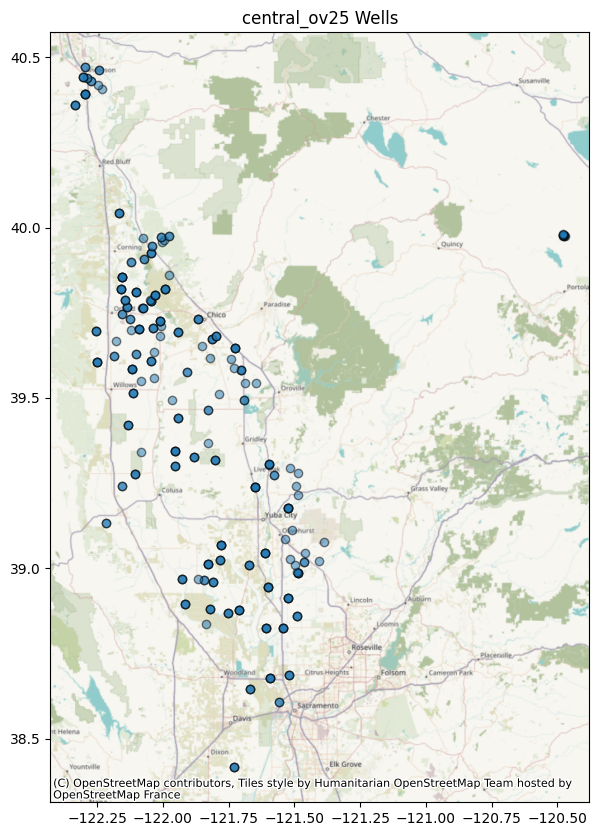

In [31]:
gdf = gpd.GeoDataFrame(central_ov25, geometry=gpd.points_from_xy(central_ov25.longitude, central_ov25.latitude))
gdf.set_crs(epsg=4326, inplace=True)

ax = gdf.plot(figsize=(10, 10), alpha=0.5, edgecolor='k')
ctx.add_basemap(ax, crs=gdf.crs.to_string())

plt.title('central_ov25 Wells')
plt.show()

In [32]:
central_ov25.Region_Off.value_counts()

Region_Off
NRO     199
NCRO     99
Name: count, dtype: int64

In [33]:
SGMA = "../data/GWBasins.shp"
gdf = gpd.read_file(SGMA)
gdf.set_crs(epsg=3857, inplace=True)
gdf.set_index('OBJECTID', inplace=True)
gdf['Basin_Prefix'] = gdf['Basin_Numb'].str.split('-').str[0].astype(int)

In [34]:
central_ov25_5021 = central_ov25[central_ov25.Basin_Subb.str.startswith("5-021")].copy()

In [35]:
central_ov25_5021

,site_code,latitude,longitude,well_depth,well_use,geology,Region_Off,Basin_Subb,observations_2010,observations_2011,...,observations_2018,observations_2019,observations_2020,observations_2021,observations_2022,observations_2023,observations_2024,min_2014_2024,wet_avg_gwe,dry_avg_gwe
3750,384159N1217303W001,38.41590,-121.73030,43.0,Observation,['Q'],NCRO,5-021.66,391,384,...,381,292,380,384,384,378,257,229,-1.736250,1.832607
3751,384159N1217303W002,38.41585,-121.73034,243.0,Observation,['Q'],NCRO,5-021.66,306,358,...,381,292,380,384,384,269,197,197,5.183161,8.165051
3752,384159N1217303W003,38.41590,-121.73030,445.0,Observation,['Q'],NCRO,5-021.66,364,384,...,381,292,380,384,384,378,197,112,12.889593,14.796562
4014,386062N1215602W001,38.60620,-121.56020,100.0,Observation,['Q'],NCRO,5-021.67,2,0,...,164,371,370,372,370,361,324,164,-2.416431,-2.257576
4015,386062N1215602W002,38.60620,-121.56020,170.0,Observation,['Q'],NCRO,5-021.67,2,0,...,310,369,370,372,370,365,324,216,-2.084139,-1.408053
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5753,399740N1219748W001,39.97397,-121.97484,263.0,Observation,['QPc'],NRO,5-021.56,368,369,...,368,366,219,368,368,368,295,219,0.005596,1.255562
5754,399740N1219748W002,39.97397,-121.97484,743.0,Observation,['QPc'],NRO,5-021.56,3,152,...,368,366,369,311,368,368,273,273,-0.048720,1.256777
5794,400428N1221665W001,40.04281,-122.16651,255.0,Observation,['Q'],NRO,5-021.50,367,368,...,369,368,105,251,371,372,299,105,7.012888,14.465136
5795,400428N1221665W002,40.04281,-122.16651,789.0,Observation,['Q'],NRO,5-021.50,302,15,...,369,368,195,266,371,372,299,195,1.951574,8.369676


/var/folders/cm/7q16kyx93zs34t0y4j49dt000000gn/T/ipykernel_12740/1198535527.py:26: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


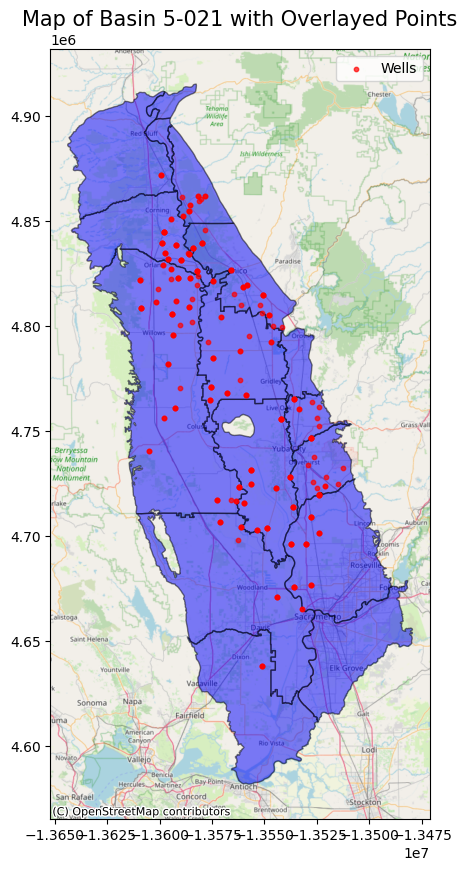

In [36]:
filtered_gdf = gdf[gdf['Basin_Numb'] == '5-021']

if filtered_gdf.crs is None:
    filtered_gdf.set_crs(epsg=4326, inplace=True)

filtered_gdf = filtered_gdf.to_crs(epsg=3857)

points_gdf = gpd.GeoDataFrame(
    central_ov25_5021,
    geometry=gpd.points_from_xy(central_ov25_5021['longitude'], central_ov25_5021['latitude'])
)

points_gdf.set_crs(epsg=4326, inplace=True)

points_gdf = points_gdf.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(10, 10))

filtered_gdf.plot(ax=ax, color='blue', edgecolor='black', alpha=0.5, label='Basin 5-021')

points_gdf.plot(ax=ax, marker='o', color='red', markersize=10, alpha=0.7, label='Wells')

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

ax.set_title('Map of Basin 5-021 with Overlayed Points', fontsize=15)
ax.legend()

plt.show()

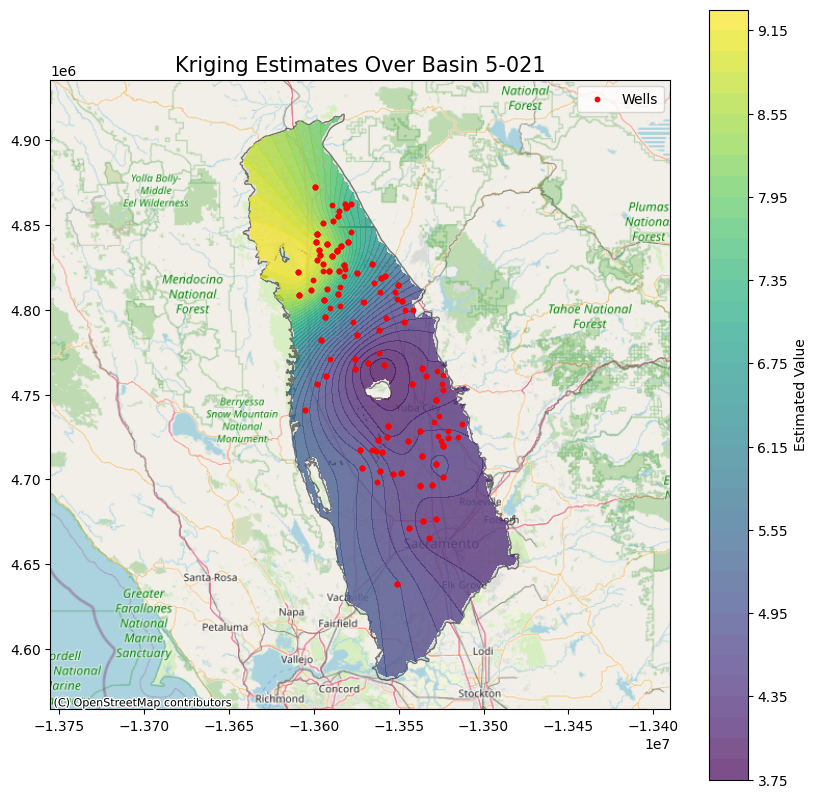

In [37]:
filtered_gdf = gdf[gdf['Basin_Numb'] == '5-021']

larger_polygon = filtered_gdf.dissolve().geometry.iloc[0]
larger_polygon_gdf = gpd.GeoDataFrame(geometry=[larger_polygon], crs=filtered_gdf.crs)
larger_polygon_gdf = larger_polygon_gdf.to_crs(epsg=32633)

bounds = larger_polygon_gdf.total_bounds

wells_gdf = gpd.GeoDataFrame(
    central_ov25_5021,
    geometry=gpd.points_from_xy(
        central_ov25_5021['longitude'], 
        central_ov25_5021['latitude']
    )
)

wells_gdf.set_crs(epsg=4326, inplace=True)
wells_gdf = wells_gdf.to_crs(larger_polygon_gdf.crs)

x = wells_gdf.geometry.x
y = wells_gdf.geometry.y
z = wells_gdf['dry_avg_gwe']  

grid_x = np.linspace(bounds[0], bounds[2], num=100)
grid_y = np.linspace(bounds[1], bounds[3], num=100)

ok = OrdinaryKriging(
    x, 
    y, 
    z, 
    variogram_model='linear'  # You can try 'spherical', 'exponential', etc.
)
z_interp, ss = ok.execute('grid', grid_x, grid_y)

xx, yy = np.meshgrid(grid_x, grid_y)

grid_points = np.vstack((xx.flatten(), yy.flatten())).T
grid_points_gdf = gpd.GeoSeries(
    gpd.points_from_xy(grid_points[:, 0], grid_points[:, 1]), 
    crs=larger_polygon_gdf.crs
)

mask = grid_points_gdf.within(larger_polygon_gdf.geometry.iloc[0])
mask = mask.values.reshape(xx.shape)
z_interp_masked = np.ma.masked_where(~mask, z_interp)

larger_polygon_3857 = larger_polygon_gdf.to_crs(epsg=3857)
wells_gdf_3857 = wells_gdf.to_crs(epsg=3857)

transformer = Transformer.from_crs("EPSG:32633", "EPSG:3857", always_xy=True)
xx_3857, yy_3857 = transformer.transform(xx, yy)

fig, ax = plt.subplots(figsize=(10, 10))
larger_polygon_3857.plot(
    ax=ax, 
    color='lightgray', 
    edgecolor='black', 
    alpha=0.5
)

contour = ax.contourf(
    xx_3857, 
    yy_3857, 
    z_interp_masked, 
    levels=50, 
    cmap='viridis', 
    alpha=0.7
)

wells_gdf_3857.plot(
    ax=ax, 
    marker='o', 
    color='red', 
    markersize=10, 
    label='Wells'
)

cbar = plt.colorbar(contour, ax=ax)
cbar.set_label('Estimated Value')

ax.set_title('Kriging Estimates Over Basin 5-021', fontsize=15)
ax.legend()

ax.set_aspect('equal')

ctx.add_basemap(
    ax, 
    crs=larger_polygon_3857.crs,
    source=ctx.providers.OpenStreetMap.Mapnik
)

plt.show()

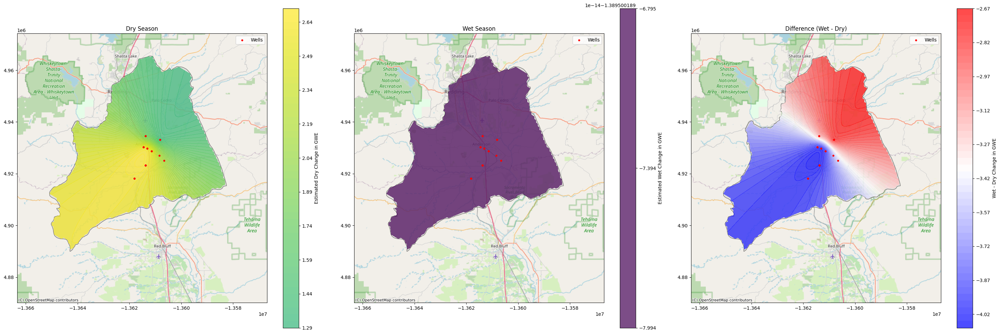

In [38]:
filtered_gdf = gdf[gdf['Basin_Numb'] == '5-006']
larger_polygon = filtered_gdf.dissolve().geometry.iloc[0]

larger_polygon_gdf = gpd.GeoDataFrame(geometry=[larger_polygon], crs=filtered_gdf.crs)

larger_polygon_gdf = larger_polygon_gdf.to_crs(epsg=32633)
bounds = larger_polygon_gdf.total_bounds

wells_gdf = gpd.GeoDataFrame(
    central_ov25[central_ov25.Basin_Subb.str.startswith("5-006")],
    geometry=gpd.points_from_xy(
        central_ov25[central_ov25.Basin_Subb.str.startswith("5-006")]['longitude'], 
        central_ov25[central_ov25.Basin_Subb.str.startswith("5-006")]['latitude']
    ),
    crs="EPSG:4326"
)
wells_gdf = wells_gdf.to_crs(larger_polygon_gdf.crs)

x = wells_gdf.geometry.x
y = wells_gdf.geometry.y

z_dry = wells_gdf['dry_avg_gwe']
z_wet = wells_gdf['wet_avg_gwe']

grid_x = np.linspace(bounds[0], bounds[2], num=100)
grid_y = np.linspace(bounds[1], bounds[3], num=100)

ok_dry = OrdinaryKriging(x, y, z_dry, variogram_model='linear')
z_interp_dry, ss_dry = ok_dry.execute('grid', grid_x, grid_y)

ok_wet = OrdinaryKriging(x, y, z_wet, variogram_model='linear')
z_interp_wet, ss_wet = ok_wet.execute('grid', grid_x, grid_y)

xx, yy = np.meshgrid(grid_x, grid_y)

grid_points = np.vstack((xx.flatten(), yy.flatten())).T
grid_points_gdf = gpd.GeoSeries(
    gpd.points_from_xy(grid_points[:, 0], grid_points[:, 1]),
    crs=larger_polygon_gdf.crs
)
mask = grid_points_gdf.within(larger_polygon_gdf.geometry.iloc[0])
mask = mask.values.reshape(xx.shape)

z_interp_masked_dry = np.ma.masked_where(~mask, z_interp_dry)
z_interp_masked_wet = np.ma.masked_where(~mask, z_interp_wet)

z_interp_diff = z_interp_wet - z_interp_dry
z_interp_masked_diff = np.ma.masked_where(~mask, z_interp_diff)

dry_values = z_interp_masked_dry.compressed()
wet_values = z_interp_masked_wet.compressed()
diff_values = z_interp_masked_diff.compressed()

wetdry_min = min(dry_values.min(), wet_values.min())
wetdry_max = max(dry_values.max(), wet_values.max())

diff_min, diff_max = diff_values.min(), diff_values.max()

larger_polygon_3857 = larger_polygon_gdf.to_crs(epsg=3857)
wells_gdf_3857 = wells_gdf.to_crs(epsg=3857)

transformer = Transformer.from_crs("EPSG:32633", "EPSG:3857", always_xy=True)
xx_3857, yy_3857 = transformer.transform(xx, yy)

fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(30, 10))

larger_polygon_3857.plot(ax=ax1, color='lightgray', edgecolor='black', alpha=0.5)

contour_dry = ax1.contourf(
    xx_3857, yy_3857,
    z_interp_masked_dry,
    levels=50,
    cmap='viridis',
    alpha=0.7,
    vmin=wetdry_min,
    vmax=wetdry_max
)

wells_gdf_3857.plot(ax=ax1, marker='o', color='red', markersize=10, label='Wells')

cbar_dry = plt.colorbar(contour_dry, ax=ax1)
cbar_dry.set_label('Estimated Dry Change in GWE')
ax1.set_title('Dry Season')
ax1.set_aspect('equal')
ax1.legend()

ctx.add_basemap(ax1, crs=larger_polygon_3857.crs, source=ctx.providers.OpenStreetMap.Mapnik)

larger_polygon_3857.plot(ax=ax2, color='lightgray', edgecolor='black', alpha=0.5)

contour_wet = ax2.contourf(
    xx_3857, yy_3857,
    z_interp_masked_wet,
    levels=50,
    cmap='viridis',
    alpha=0.7,
    vmin=wetdry_min,
    vmax=wetdry_max
)

wells_gdf_3857.plot(ax=ax2, marker='o', color='red', markersize=10, label='Wells')

cbar_wet = plt.colorbar(contour_wet, ax=ax2)
cbar_wet.set_label('Estimated Wet Change in GWE')
ax2.set_title('Wet Season')
ax2.set_aspect('equal')
ax2.legend()

ctx.add_basemap(ax2, crs=larger_polygon_3857.crs, source=ctx.providers.OpenStreetMap.Mapnik)

larger_polygon_3857.plot(ax=ax3, color='lightgray', edgecolor='black', alpha=0.5)

contour_diff = ax3.contourf(
    xx_3857, yy_3857,
    z_interp_masked_diff,
    levels=50,
    cmap='bwr',
    alpha=0.7,
    vmin=diff_min,
    vmax=diff_max
)

wells_gdf_3857.plot(ax=ax3, marker='o', color='red', markersize=10, label='Wells')

cbar_diff = plt.colorbar(contour_diff, ax=ax3)
cbar_diff.set_label('Wet - Dry Change in GWE')
ax3.set_title('Difference (Wet - Dry)')
ax3.set_aspect('equal')
ax3.legend()

ctx.add_basemap(ax3, crs=larger_polygon_3857.crs, source=ctx.providers.OpenStreetMap.Mapnik)

plt.tight_layout()
plt.show()

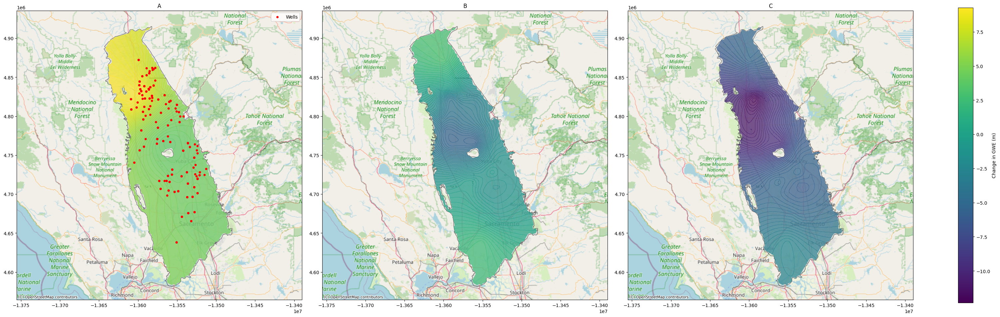

In [43]:
filtered_gdf = gdf[gdf['Basin_Numb'] == '5-021']
larger_polygon = filtered_gdf.dissolve().geometry.iloc[0]
larger_polygon_gdf = gpd.GeoDataFrame(
    geometry=[larger_polygon],
    crs=filtered_gdf.crs
)
larger_polygon_gdf = larger_polygon_gdf.to_crs(epsg=32633)
bounds = larger_polygon_gdf.total_bounds  # [minx, miny, maxx, maxy]

wells_gdf = gpd.GeoDataFrame(
    central_ov25_5021,
    geometry=gpd.points_from_xy(
        central_ov25_5021['longitude'], 
        central_ov25_5021['latitude']
    ),
    crs="EPSG:4326"
)

wells_gdf = wells_gdf.to_crs(larger_polygon_gdf.crs)

x = wells_gdf.geometry.x
y = wells_gdf.geometry.y
z_dry = wells_gdf['dry_avg_gwe']
z_wet = wells_gdf['wet_avg_gwe']

grid_x = np.linspace(bounds[0], bounds[2], num=100)
grid_y = np.linspace(bounds[1], bounds[3], num=100)

ok_dry = OrdinaryKriging(x, y, z_dry, variogram_model='linear')
z_interp_dry, ss_dry = ok_dry.execute('grid', grid_x, grid_y)

ok_wet = OrdinaryKriging(x, y, z_wet, variogram_model='linear')
z_interp_wet, ss_wet = ok_wet.execute('grid', grid_x, grid_y)

xx, yy = np.meshgrid(grid_x, grid_y)

grid_points = np.vstack((xx.flatten(), yy.flatten())).T
grid_points_gdf = gpd.GeoSeries(
    gpd.points_from_xy(grid_points[:, 0], grid_points[:, 1]),
    crs=larger_polygon_gdf.crs
)

mask = grid_points_gdf.within(larger_polygon_gdf.geometry.iloc[0])
mask = mask.values.reshape(xx.shape)

z_interp_masked_dry = np.ma.masked_where(~mask, z_interp_dry)
z_interp_masked_wet = np.ma.masked_where(~mask, z_interp_wet)

z_interp_diff = z_interp_wet - z_interp_dry
z_interp_masked_diff = np.ma.masked_where(~mask, z_interp_diff)

dry_vals = z_interp_masked_dry.compressed()
wet_vals = z_interp_masked_wet.compressed()
diff_vals = z_interp_masked_diff.compressed()

global_min = min(dry_vals.min(), wet_vals.min(), diff_vals.min())
global_max = max(dry_vals.max(), wet_vals.max(), diff_vals.max())

larger_polygon_3857 = larger_polygon_gdf.to_crs(epsg=3857)
wells_gdf_3857 = wells_gdf.to_crs(epsg=3857)

transformer = Transformer.from_crs("EPSG:32633", "EPSG:3857", always_xy=True)
xx_3857, yy_3857 = transformer.transform(xx, yy)

fig, (ax1, ax2, ax3) = plt.subplots(
    ncols=3, 
    figsize=(30, 10), 
    constrained_layout=True
)

norm = mpl.colors.Normalize(vmin=global_min, vmax=global_max)
cmap = 'viridis'

larger_polygon_3857.plot(ax=ax1, color='lightgray', edgecolor='black', alpha=0.5)
contour_dry = ax1.contourf(
    xx_3857, yy_3857,
    z_interp_masked_dry,
    levels=50,
    cmap=cmap,
    norm=norm,
    alpha=0.7
)
wells_gdf_3857.plot(ax=ax1, marker='o', color='red', markersize=15, label='Wells')
ax1.set_title('A')
ax1.set_aspect('equal')
ax1.legend()
ctx.add_basemap(ax1, crs=larger_polygon_3857.crs, source=ctx.providers.OpenStreetMap.Mapnik)

larger_polygon_3857.plot(ax=ax2, color='lightgray', edgecolor='black', alpha=0.5)
contour_wet = ax2.contourf(
    xx_3857, yy_3857,
    z_interp_masked_wet,
    levels=50,
    cmap=cmap,
    norm=norm,
    alpha=0.7
)
ax2.set_title('B')
ax2.set_aspect('equal')
ctx.add_basemap(ax2, crs=larger_polygon_3857.crs, source=ctx.providers.OpenStreetMap.Mapnik)

larger_polygon_3857.plot(ax=ax3, color='lightgray', edgecolor='black', alpha=0.5)
contour_diff = ax3.contourf(
    xx_3857, yy_3857,
    z_interp_masked_diff,
    levels=50,
    cmap=cmap,
    norm=norm,
    alpha=0.7
)
ax3.set_title('C')
ax3.set_aspect('equal')
ctx.add_basemap(ax3, crs=larger_polygon_3857.crs, source=ctx.providers.OpenStreetMap.Mapnik)

sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = fig.colorbar(
    sm, 
    ax=[ax1, ax2, ax3],
    fraction=0.1,
    shrink = 0.9
)
cbar.set_label("Change in GWE (m)")

plt.show()

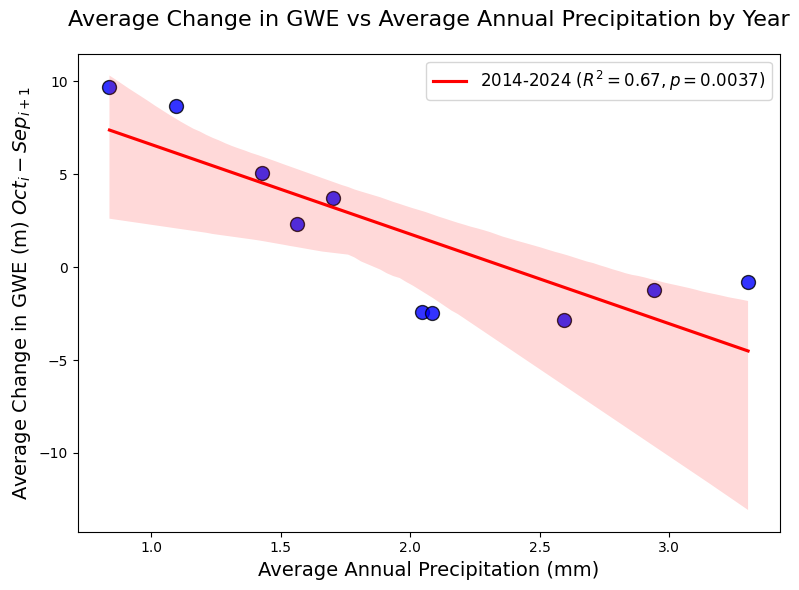

Slope: -4.8209
Intercept: 11.4140
R-squared: 0.6722
p-value: 3.6832e-03
Std. Error: 1.1903


In [40]:
years = []
avg_gwe_changes = []
avg_precipitations = []

for year, gwe_changes in changes.items():
    precipitation_data = well_precipitation.get(year, {})
    
    gwe_values = []
    precipitation_values = []
    
    for site_code in central_ov25_5021['site_code']:
        if site_code in gwe_changes and site_code in precipitation_data:
            gwe_values.append(gwe_changes[site_code])
            precipitation_values.append(precipitation_data[site_code])
    
    if gwe_values and precipitation_values:
        avg_gwe = sum(gwe_values) / len(gwe_values)
        avg_precip = sum(precipitation_values) / len(precipitation_values)
        
        years.append(year)
        avg_gwe_changes.append(avg_gwe)
        avg_precipitations.append(avg_precip)

data = pd.DataFrame({
    'Year': years,
    'Average Change in GWE': avg_gwe_changes,
    'Average Annual Precipitation': avg_precipitations
})

slope, intercept, r_value, p_value, std_err = linregress(
    data['Average Annual Precipitation'], 
    data['Average Change in GWE']
)
r_squared = r_value ** 2

plt.figure(figsize=(8, 6))
sns.regplot(
    x='Average Annual Precipitation', 
    y='Average Change in GWE', 
    data=data, 
    scatter_kws={'s': 100, 'edgecolor': 'black', 'color': 'blue'},
    line_kws={
        'color': 'red', 
        'label': f'2014-2024 $(R^2 = {r_squared:.2f}, p = {p_value:.4f})$'
    }
)

plt.xlabel('Average Annual Precipitation (mm)', fontsize=14)
plt.ylabel('Average Change in GWE (m) $Oct_i - Sep_{i+1}$', fontsize=14)
plt.title('Average Change in GWE vs Average Annual Precipitation by Year', fontsize=16, pad=20)
plt.legend(fontsize=12)
plt.tight_layout()

plt.show()

print(f"Slope: {slope:.4f}")
print(f"Intercept: {intercept:.4f}")
print(f"R-squared: {r_squared:.4f}")
print(f"p-value: {p_value:.4e}")
print(f"Std. Error: {std_err:.4f}")

TODO: colour bar centre at 0 and topo type colours, map gradients by well and then try gradient against depth

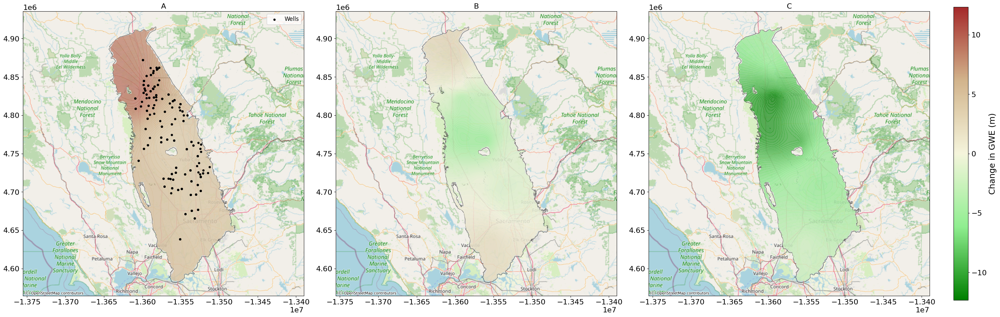

In [44]:
plt.rcParams.update({
    'font.size': 14,
    'axes.titlesize': 26,
    'axes.labelsize': 18,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
    'legend.fontsize': 16,
    'figure.titlesize': 32
})

filtered_gdf = gdf[gdf['Basin_Numb'] == '5-021']
larger_polygon = filtered_gdf.dissolve().geometry.iloc[0]
larger_polygon_gdf = gpd.GeoDataFrame(
    geometry=[larger_polygon],
    crs=filtered_gdf.crs
)
larger_polygon_gdf = larger_polygon_gdf.to_crs(epsg=32633)
bounds = larger_polygon_gdf.total_bounds

wells_gdf = gpd.GeoDataFrame(
    central_ov25_5021,
    geometry=gpd.points_from_xy(
        central_ov25_5021['longitude'], 
        central_ov25_5021['latitude']
    ),
    crs="EPSG:4326"
)

wells_gdf = wells_gdf.to_crs(larger_polygon_gdf.crs)

x = wells_gdf.geometry.x
y = wells_gdf.geometry.y
z_dry = wells_gdf['dry_avg_gwe']
z_wet = wells_gdf['wet_avg_gwe']

grid_x = np.linspace(bounds[0], bounds[2], num=100)
grid_y = np.linspace(bounds[1], bounds[3], num=100)

ok_dry = OrdinaryKriging(x, y, z_dry, variogram_model='linear')
z_interp_dry, ss_dry = ok_dry.execute('grid', grid_x, grid_y)

ok_wet = OrdinaryKriging(x, y, z_wet, variogram_model='linear')
z_interp_wet, ss_wet = ok_wet.execute('grid', grid_x, grid_y)

xx, yy = np.meshgrid(grid_x, grid_y)

grid_points = np.vstack((xx.flatten(), yy.flatten())).T
grid_points_gdf = gpd.GeoSeries(
    gpd.points_from_xy(grid_points[:, 0], grid_points[:, 1]),
    crs=larger_polygon_gdf.crs
)

mask = grid_points_gdf.within(larger_polygon_gdf.geometry.iloc[0])
mask = mask.values.reshape(xx.shape)

z_interp_masked_dry = np.ma.masked_where(~mask, z_interp_dry)
z_interp_masked_wet = np.ma.masked_where(~mask, z_interp_wet)

z_interp_diff = z_interp_wet - z_interp_dry
z_interp_masked_diff = np.ma.masked_where(~mask, z_interp_diff)

dry_vals = z_interp_masked_dry.compressed()
wet_vals = z_interp_masked_wet.compressed()
diff_vals = z_interp_masked_diff.compressed()

global_min = min(dry_vals.min(), wet_vals.min(), diff_vals.min())
global_max = max(dry_vals.max(), wet_vals.max(), diff_vals.max())

max_abs_value = max(abs(global_min), abs(global_max))
norm = mpl.colors.Normalize(vmin=-max_abs_value, vmax=max_abs_value)

colors = ["green", "lightgreen", "beige", "tan", "brown"]
cmap = mpl.colors.LinearSegmentedColormap.from_list("green_to_brown", colors)

larger_polygon_3857 = larger_polygon_gdf.to_crs(epsg=3857)
wells_gdf_3857 = wells_gdf.to_crs(epsg=3857)

transformer = Transformer.from_crs("EPSG:32633", "EPSG:3857", always_xy=True)
xx_3857, yy_3857 = transformer.transform(xx, yy)

fig, (ax1, ax2, ax3) = plt.subplots(
    ncols=3, 
    figsize=(30, 10), 
    constrained_layout=True
)

larger_polygon_3857.plot(ax=ax1, color='lightgray', edgecolor='black', alpha=0.5)
contour_dry = ax1.contourf(
    xx_3857, yy_3857,
    z_interp_masked_dry,
    levels=50,
    cmap=cmap,
    norm=norm,
    alpha=0.7
)
wells_gdf_3857.plot(ax=ax1, marker='o', color='black', markersize=15, label='Wells')
ax1.set_title('A', fontsize=16)
ax1.set_aspect('equal')
ax1.legend(fontsize=12)
ctx.add_basemap(ax1, crs=larger_polygon_3857.crs, source=ctx.providers.OpenStreetMap.Mapnik)

larger_polygon_3857.plot(ax=ax2, color='lightgray', edgecolor='black', alpha=0.5)
contour_wet = ax2.contourf(
    xx_3857, yy_3857,
    z_interp_masked_wet,
    levels=50,
    cmap=cmap,
    norm=norm,
    alpha=0.7
)
ax2.set_title('B', fontsize=16)
ax2.set_aspect('equal')
ctx.add_basemap(ax2, crs=larger_polygon_3857.crs, source=ctx.providers.OpenStreetMap.Mapnik)

larger_polygon_3857.plot(ax=ax3, color='lightgray', edgecolor='black', alpha=0.5)
contour_diff = ax3.contourf(
    xx_3857, yy_3857,
    z_interp_masked_diff,
    levels=50,
    cmap=cmap,
    norm=norm,
    alpha=0.7
)
ax3.set_title('C', fontsize=16)
ax3.set_aspect('equal')
ctx.add_basemap(ax3, crs=larger_polygon_3857.crs, source=ctx.providers.OpenStreetMap.Mapnik)

sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = fig.colorbar(
    sm, 
    ax=[ax1, ax2, ax3],
    fraction=0.1,
    shrink=0.9,
    pad=0.02
)
cbar.set_label("Change in GWE (m)", fontsize=18)

plt.show()

In [45]:
dry_values = np.ma.filled(z_interp_masked_dry, np.nan).flatten()
wet_values = np.ma.filled(z_interp_masked_wet, np.nan).flatten()
diff_values = np.ma.filled(z_interp_masked_diff, np.nan).flatten()

# Transform coordinates to lat/long
from pyproj import Transformer
transformer = Transformer.from_crs("EPSG:32633", "EPSG:4326", always_xy=True)
lon, lat = transformer.transform(xx.flatten(), yy.flatten())

# Create the DataFrame
df_surfaces = pd.DataFrame({
    'longitude': lon,
    'latitude': lat,
    'dry_avg_gwe': dry_values,
    'wet_avg_gwe': wet_values,
    'diff_gwe': diff_values
})

In [49]:
surfaces_5021 = df_surfaces[~df_surfaces.dry_avg_gwe.isna()]

In [50]:
geometry = [Point(xy) for xy in zip(surfaces_5021['longitude'], surfaces_5021['latitude'])]

In [51]:
surfaces_5021 = gpd.GeoDataFrame(surfaces_5021, geometry=geometry)

In [55]:
data = {}
for site_code in set().union(*[d.keys() for d in changes.values()]):
    years = sorted(changes.keys())
    change_values = [changes[year].get(site_code, None) for year in years]
    precipitation_values = [well_precipitation[year].get(site_code, None) for year in years]
    
    valid_data = [(c, p) for c, p in zip(change_values, precipitation_values) if c is not None and p is not None]
    if valid_data:
        data[site_code] = {
            "change": [c for c, p in valid_data],
            "precipitation": [p for c, p in valid_data]
        }

gradients = {}
for site_code, values in data.items():
    slope, intercept, r_value, p_value, std_err = linregress(values["precipitation"], values["change"])
    r_squared = r_value ** 2
    
    gradients[site_code] = {
        "slope": slope,
        "slope_r_squared": r_squared,
        "slope_p_value": p_value
    }

In [56]:
central_ov25_5021["slope"] = central_ov25_5021["site_code"].map(lambda x: gradients.get(x, {}).get("slope", None))
central_ov25_5021["slope_r_squared"] = central_ov25_5021["site_code"].map(lambda x: gradients.get(x, {}).get("slope_r_squared", None))
central_ov25_5021["slope_p_value"] = central_ov25_5021["site_code"].map(lambda x: gradients.get(x, {}).get("slope_p_value", None))

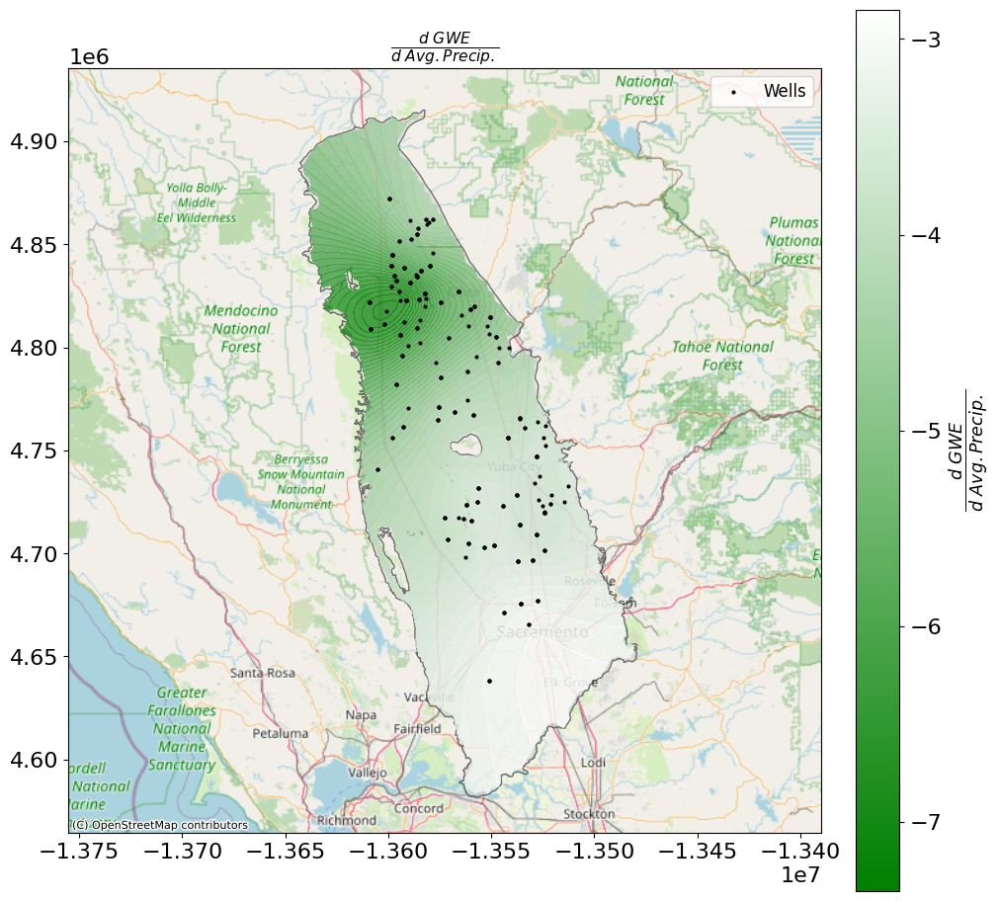

In [57]:
plt.rcParams.update({
    'font.size': 14,
    'axes.titlesize': 26,
    'axes.labelsize': 18,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
    'legend.fontsize': 16,
    'figure.titlesize': 32
})

filtered_gdf = gdf[gdf['Basin_Numb'] == '5-021']
larger_polygon = filtered_gdf.dissolve().geometry.iloc[0]
larger_polygon_gdf = gpd.GeoDataFrame(
    geometry=[larger_polygon],
    crs=filtered_gdf.crs
)
larger_polygon_gdf = larger_polygon_gdf.to_crs(epsg=32633)
bounds = larger_polygon_gdf.total_bounds

wells_gdf = gpd.GeoDataFrame(
    central_ov25_5021,
    geometry=gpd.points_from_xy(
        central_ov25_5021['longitude'], 
        central_ov25_5021['latitude']
    ),
    crs="EPSG:4326"
)
wells_gdf = wells_gdf.to_crs(larger_polygon_gdf.crs)

x = wells_gdf.geometry.x
y = wells_gdf.geometry.y
z_slope = wells_gdf['slope']

grid_x = np.linspace(bounds[0], bounds[2], num=100)
grid_y = np.linspace(bounds[1], bounds[3], num=100)

ok_slope = OrdinaryKriging(x, y, z_slope, variogram_model='linear')
z_interp_slope, ss_slope = ok_slope.execute('grid', grid_x, grid_y)

xx, yy = np.meshgrid(grid_x, grid_y)

grid_points = np.vstack((xx.flatten(), yy.flatten())).T
grid_points_gdf = gpd.GeoSeries(
    gpd.points_from_xy(grid_points[:, 0], grid_points[:, 1]),
    crs=larger_polygon_gdf.crs
)
mask = grid_points_gdf.within(larger_polygon_gdf.geometry.iloc[0])
mask = mask.values.reshape(xx.shape)
z_interp_masked_slope = np.ma.masked_where(~mask, z_interp_slope)

slope_vals = z_interp_masked_slope.compressed()
min_val = slope_vals.min()
max_val = slope_vals.max()
norm = mpl.colors.TwoSlopeNorm(vmin=min_val, vcenter=(min_val+max_val)/2, vmax=max_val)

colors = ["green", "white"]
cmap = mpl.colors.LinearSegmentedColormap.from_list("brown_white_green", colors)

larger_polygon_3857 = larger_polygon_gdf.to_crs(epsg=3857)
wells_gdf_3857 = wells_gdf.to_crs(epsg=3857)

transformer = Transformer.from_crs("EPSG:32633", "EPSG:3857", always_xy=True)
xx_3857, yy_3857 = transformer.transform(xx, yy)

fig, ax = plt.subplots(figsize=(10, 10), constrained_layout=True)

larger_polygon_3857.plot(ax=ax, color='lightgray', edgecolor='black', alpha=0.5)

contour_slope = ax.contourf(
    xx_3857, yy_3857,
    z_interp_masked_slope,
    levels=50,
    cmap=cmap,
    norm=norm,
    alpha=0.7
)

wells_gdf_3857.plot(ax=ax, marker='.', color='black', markersize=15, label='Wells')
ctx.add_basemap(ax, crs=larger_polygon_3857.crs, source=ctx.providers.OpenStreetMap.Mapnik)

ax.set_title(r"$\frac{d\ GWE}{d\ Avg. Precip.}$", fontsize=16)
ax.set_aspect('equal')
ax.legend(fontsize=12)

sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = fig.colorbar(
    sm, 
    ax=ax,
    fraction=0.1,
    shrink=0.9,
    pad=0.02
)
cbar.set_label(r"$\frac{d\ GWE}{d\ Avg. Precip.}$", fontsize=18)

plt.show()

In [58]:
central_ov25_5021[(central_ov25_5021.slope_p_value < 0.05) & (~central_ov25_5021.well_depth.isna())]

,site_code,latitude,longitude,well_depth,well_use,geology,Region_Off,Basin_Subb,observations_2010,observations_2011,...,observations_2021,observations_2022,observations_2023,observations_2024,min_2014_2024,wet_avg_gwe,dry_avg_gwe,slope,slope_r_squared,slope_p_value
3750,384159N1217303W001,38.41590,-121.73030,43.0,Observation,['Q'],NCRO,5-021.66,391,384,...,384,384,378,257,229,-1.736250,1.832607,-2.059509,0.539898,0.015491
4119,386464N1216675W002,38.64640,-121.66750,150.0,Observation,['Q'],NCRO,5-021.67,374,377,...,325,302,280,341,131,-3.854558,-1.224645,-1.221176,0.502906,0.021648
4199,386782N1215943W001,38.67820,-121.59430,1080.0,Observation,['Q'],NCRO,5-021.64,375,371,...,427,373,366,299,299,-2.336238,0.511154,-1.612986,0.491013,0.023997
4200,386782N1215943W002,38.67820,-121.59430,815.0,Observation,['Q'],NCRO,5-021.64,375,94,...,264,373,366,299,264,-5.712411,1.964259,-4.513001,0.643201,0.005255
4231,386864N1215222W001,38.68640,-121.52220,995.0,Observation,['Q'],NCRO,5-021.64,374,371,...,427,299,326,369,214,-2.197159,1.313146,-2.618703,0.595510,0.008930
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5751,399733N1220069W002,39.97330,-122.00690,530.0,Observation,['Q'],NRO,5-021.56,236,369,...,368,368,368,295,152,0.307238,2.112255,-0.954439,0.810270,0.000385
5753,399740N1219748W001,39.97397,-121.97484,263.0,Observation,['QPc'],NRO,5-021.56,368,369,...,368,368,368,295,219,0.005596,1.255562,-0.729986,0.881031,0.000058
5754,399740N1219748W002,39.97397,-121.97484,743.0,Observation,['QPc'],NRO,5-021.56,3,152,...,311,368,368,273,273,-0.048720,1.256777,-0.808072,0.853363,0.000135
5794,400428N1221665W001,40.04281,-122.16651,255.0,Observation,['Q'],NRO,5-021.50,367,368,...,251,371,372,299,105,7.012888,14.465136,-3.491433,0.524792,0.017808


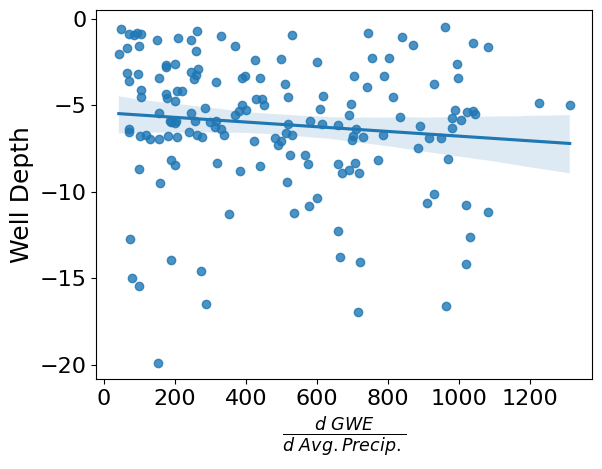

In [59]:
sns.regplot(x='well_depth', y='slope', 
                data=central_ov25_5021[(central_ov25_5021.slope_p_value < 0.05) & (~central_ov25_5021.well_depth.isna())])

plt.xlabel(r"$\frac{d\ GWE}{d\ Avg. Precip.}$")
plt.ylabel('Well Depth')

plt.show()

In [60]:
central_ov25_5021[central_ov25_5021.slope_p_value < 0.05].slope.describe()

count    162.000000
mean      -6.091609
std        3.755311
min      -19.871520
25%       -7.431482
50%       -5.887133
75%       -3.417252
max       -0.459356
Name: slope, dtype: float64

Doing false discovery control to account for dependency between p-values.

In [61]:
central_ov25_5021["slope_p_fdr"] = stats.false_discovery_control(central_ov25_5021["slope_p_value"])

In [62]:
sum(central_ov25_5021["slope_p_fdr"] < 0.05)

139

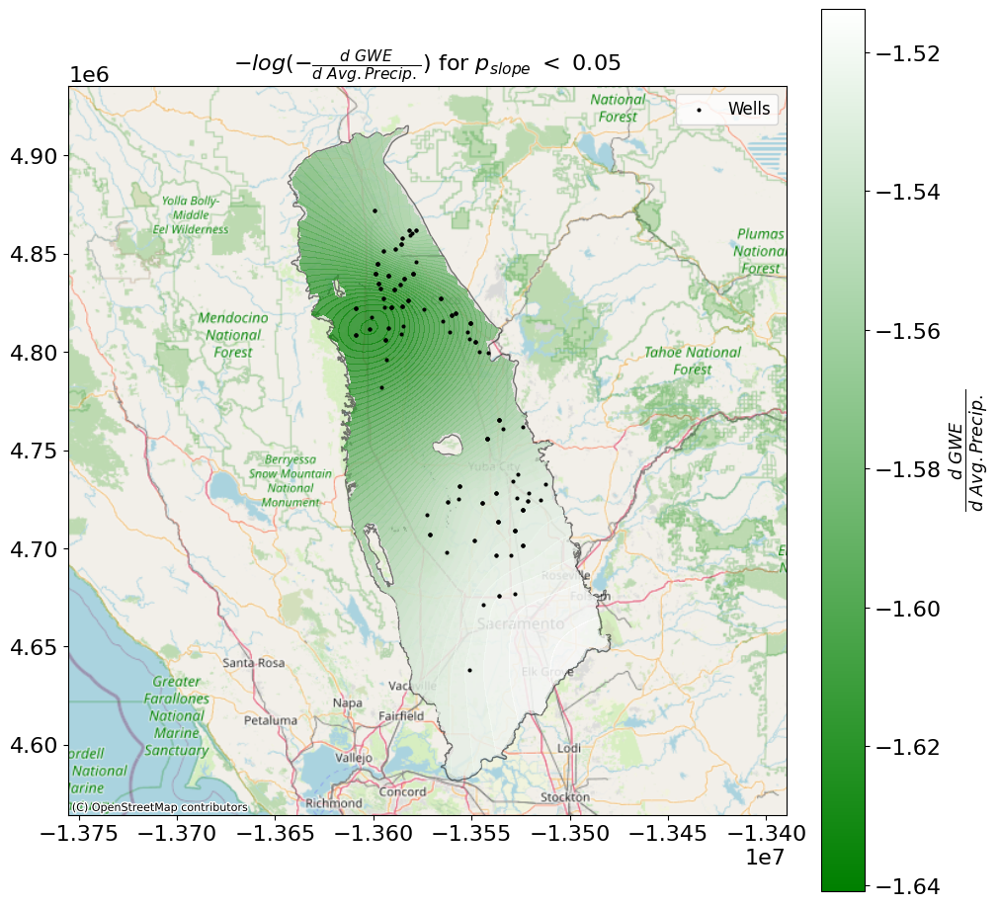

In [63]:
plt.rcParams.update({
    'font.size': 14,
    'axes.titlesize': 26,
    'axes.labelsize': 18,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
    'legend.fontsize': 16,
    'figure.titlesize': 32
})

filtered_gdf = gdf[gdf['Basin_Numb'] == '5-021']
larger_polygon = filtered_gdf.dissolve().geometry.iloc[0]
larger_polygon_gdf = gpd.GeoDataFrame(
    geometry=[larger_polygon],
    crs=filtered_gdf.crs
)
larger_polygon_gdf = larger_polygon_gdf.to_crs(epsg=32633)
bounds = larger_polygon_gdf.total_bounds

filtered_points = central_ov25_5021[central_ov25_5021['slope_p_value'] < 0.05]

wells_gdf = gpd.GeoDataFrame(
    filtered_points,
    geometry=gpd.points_from_xy(
        filtered_points['longitude'], 
        filtered_points['latitude']
    ),
    crs="EPSG:4326"
)
wells_gdf = wells_gdf.to_crs(larger_polygon_gdf.crs)

x = wells_gdf.geometry.x
y = wells_gdf.geometry.y
z_slope = -np.log(-wells_gdf['slope'])

grid_x = np.linspace(bounds[0], bounds[2], num=100)
grid_y = np.linspace(bounds[1], bounds[3], num=100)

ok_slope = OrdinaryKriging(x, y, z_slope, variogram_model='linear')
z_interp_slope, ss_slope = ok_slope.execute('grid', grid_x, grid_y)

xx, yy = np.meshgrid(grid_x, grid_y)

grid_points = np.vstack((xx.flatten(), yy.flatten())).T
grid_points_gdf = gpd.GeoSeries(
    gpd.points_from_xy(grid_points[:, 0], grid_points[:, 1]),
    crs=larger_polygon_gdf.crs
)
mask = grid_points_gdf.within(larger_polygon_gdf.geometry.iloc[0])
mask = mask.values.reshape(xx.shape)
z_interp_masked_slope = np.ma.masked_where(~mask, z_interp_slope)

slope_vals = z_interp_masked_slope.compressed()
min_val = slope_vals.min()
max_val = slope_vals.max()
norm = mpl.colors.TwoSlopeNorm(vmin=min_val, vcenter=(min_val+max_val)/2, vmax=max_val)

colors = ["green", "white"]
cmap = mpl.colors.LinearSegmentedColormap.from_list("brown_white_green", colors)

larger_polygon_3857 = larger_polygon_gdf.to_crs(epsg=3857)
wells_gdf_3857 = wells_gdf.to_crs(epsg=3857)

transformer = Transformer.from_crs("EPSG:32633", "EPSG:3857", always_xy=True)
xx_3857, yy_3857 = transformer.transform(xx, yy)

fig, ax = plt.subplots(figsize=(10, 10), constrained_layout=True)

larger_polygon_3857.plot(ax=ax, color='lightgray', edgecolor='black', alpha=0.5)

contour_slope = ax.contourf(
    xx_3857, yy_3857,
    z_interp_masked_slope,
    levels=50,
    cmap=cmap,
    norm=norm,
    alpha=0.7
)

wells_gdf_3857.plot(ax=ax, marker='.', color='black', markersize=15, label='Wells')
ctx.add_basemap(ax, crs=larger_polygon_3857.crs, source=ctx.providers.OpenStreetMap.Mapnik)

ax.set_title(r"$-log(-\frac{d\ GWE}{d\ Avg. Precip.})$ for $p_{slope}\ <\ 0.05$", fontsize=16)
ax.set_aspect('equal')
ax.legend(fontsize=12)

sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = fig.colorbar(
    sm, 
    ax=ax,
    fraction=0.1,
    shrink=0.9,
    pad=0.02
)
cbar.set_label(r"$\frac{d\ GWE}{d\ Avg. Precip.}$", fontsize=18)

plt.show()

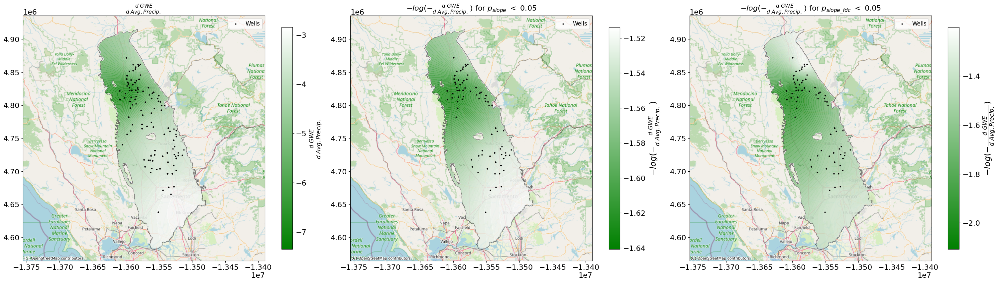

In [146]:
plt.rcParams.update({
    'font.size': 14,
    'axes.titlesize': 26,
    'axes.labelsize': 18,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
    'legend.fontsize': 16,
    'figure.titlesize': 32
})

filtered_gdf = gdf[gdf['Basin_Numb'] == '5-021']
larger_polygon = filtered_gdf.dissolve().geometry.iloc[0]
larger_polygon_gdf = gpd.GeoDataFrame(geometry=[larger_polygon], crs=filtered_gdf.crs)
larger_polygon_gdf = larger_polygon_gdf.to_crs(epsg=32633)
bounds = larger_polygon_gdf.total_bounds

grid_x = np.linspace(bounds[0], bounds[2], num=100)
grid_y = np.linspace(bounds[1], bounds[3], num=100)

transformer = Transformer.from_crs("EPSG:32633", "EPSG:3857", always_xy=True)
colors = ["green", "white"]

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 10), constrained_layout=True)

#############################################
# LEFT PANEL: Original Slope Interpolation  #
#############################################

wells_gdf = gpd.GeoDataFrame(
    central_ov25_5021,
    geometry=gpd.points_from_xy(central_ov25_5021['longitude'], central_ov25_5021['latitude']),
    crs="EPSG:4326"
).to_crs(larger_polygon_gdf.crs)

x = wells_gdf.geometry.x
y = wells_gdf.geometry.y
z_slope = wells_gdf['slope']

ok_slope = OrdinaryKriging(x, y, z_slope, variogram_model='linear')
z_interp_slope, ss_slope = ok_slope.execute('grid', grid_x, grid_y)
xx, yy = np.meshgrid(grid_x, grid_y)

grid_points = np.vstack((xx.flatten(), yy.flatten())).T
grid_points_gdf = gpd.GeoSeries(
    gpd.points_from_xy(grid_points[:, 0], grid_points[:, 1]),
    crs=larger_polygon_gdf.crs
)
mask = grid_points_gdf.within(larger_polygon_gdf.geometry.iloc[0]).values.reshape(xx.shape)
z_interp_masked_slope = np.ma.masked_where(~mask, z_interp_slope)

slope_vals = z_interp_masked_slope.compressed()
min_val = slope_vals.min()
max_val = slope_vals.max()
norm = mpl.colors.TwoSlopeNorm(vmin=min_val, vcenter=(min_val+max_val)/2, vmax=max_val)
cmap = mpl.colors.LinearSegmentedColormap.from_list("brown_white_green", colors)

larger_polygon_3857 = larger_polygon_gdf.to_crs(epsg=3857)
wells_gdf_3857 = wells_gdf.to_crs(epsg=3857)
xx_3857, yy_3857 = transformer.transform(xx, yy)

larger_polygon_3857.plot(ax=ax1, color='lightgray', edgecolor='black', alpha=0.5)
ax1.contourf(xx_3857, yy_3857, z_interp_masked_slope, levels=50, cmap=cmap, norm=norm, alpha=0.7)
wells_gdf_3857.plot(ax=ax1, marker='.', color='black', markersize=15, label='Wells')
ctx.add_basemap(ax1, crs=larger_polygon_3857.crs, source=ctx.providers.OpenStreetMap.Mapnik)
ax1.set_title(r"$\frac{d\ GWE}{d\ Avg. Precip.}$", fontsize=16)
ax1.set_aspect('equal')
ax1.legend(fontsize=12)
sm1 = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm1.set_array([])
cbar1 = fig.colorbar(sm1, ax=ax1, fraction=0.046, pad=0.04)
cbar1.set_label(r"$\frac{d\ GWE}{d\ Avg. Precip.}$", fontsize=18)

######################################################
# MIDDLE PANEL: Log Transform (p-value < 0.05 Filter)  #
######################################################

filtered_points = central_ov25_5021[central_ov25_5021['slope_p_value'] < 0.05]
wells_gdf_sig = gpd.GeoDataFrame(
    filtered_points,
    geometry=gpd.points_from_xy(filtered_points['longitude'], filtered_points['latitude']),
    crs="EPSG:4326"
).to_crs(larger_polygon_gdf.crs)

x_sig = wells_gdf_sig.geometry.x
y_sig = wells_gdf_sig.geometry.y
z_slope_sig = -np.log(-wells_gdf_sig['slope'])

ok_slope_sig = OrdinaryKriging(x_sig, y_sig, z_slope_sig, variogram_model='linear')
z_interp_slope_sig, ss_slope_sig = ok_slope_sig.execute('grid', grid_x, grid_y)
xx_sig, yy_sig = np.meshgrid(grid_x, grid_y)

grid_points_sig = np.vstack((xx_sig.flatten(), yy_sig.flatten())).T
grid_points_gdf_sig = gpd.GeoSeries(
    gpd.points_from_xy(grid_points_sig[:, 0], grid_points_sig[:, 1]),
    crs=larger_polygon_gdf.crs
)
mask_sig = grid_points_gdf_sig.within(larger_polygon_gdf.geometry.iloc[0]).values.reshape(xx_sig.shape)
z_interp_masked_slope_sig = np.ma.masked_where(~mask_sig, z_interp_slope_sig)

slope_vals_sig = z_interp_masked_slope_sig.compressed()
min_val_sig = slope_vals_sig.min()
max_val_sig = slope_vals_sig.max()
norm_sig = mpl.colors.TwoSlopeNorm(vmin=min_val_sig, vcenter=(min_val_sig+max_val_sig)/2, vmax=max_val_sig)
cmap_sig = mpl.colors.LinearSegmentedColormap.from_list("brown_white_green", colors)

larger_polygon_3857_sig = larger_polygon_gdf.to_crs(epsg=3857)
wells_gdf_3857_sig = wells_gdf_sig.to_crs(epsg=3857)
xx_3857_sig, yy_3857_sig = transformer.transform(xx_sig, yy_sig)

larger_polygon_3857_sig.plot(ax=ax2, color='lightgray', edgecolor='black', alpha=0.5)
ax2.contourf(xx_3857_sig, yy_3857_sig, z_interp_masked_slope_sig, levels=50, cmap=cmap_sig, norm=norm_sig, alpha=0.7)
wells_gdf_3857_sig.plot(ax=ax2, marker='.', color='black', markersize=15, label='Wells')
ctx.add_basemap(ax2, crs=larger_polygon_3857_sig.crs, source=ctx.providers.OpenStreetMap.Mapnik)
ax2.set_title(r"$-log(-\frac{d\ GWE}{d\ Avg. Precip.})$ for $p_{slope}\ <\ 0.05$", fontsize=16)
ax2.set_aspect('equal')
ax2.legend(fontsize=12)
sm2 = mpl.cm.ScalarMappable(norm=norm_sig, cmap=cmap_sig)
sm2.set_array([])
cbar2 = fig.colorbar(sm2, ax=ax2, fraction=0.046, pad=0.04)
cbar2.set_label(r"$-log(-\frac{d\ GWE}{d\ Avg. Precip.})$", fontsize=18)

###################################################################
# RIGHT PANEL: Log Transform (p_fdr < 0.05 Filter) – Third Plot    #
###################################################################

filtered_points_fdr = central_ov25_5021[central_ov25_5021['slope_p_fdr'] < 0.05]
wells_gdf_fdr = gpd.GeoDataFrame(
    filtered_points_fdr,
    geometry=gpd.points_from_xy(filtered_points_fdr['longitude'], filtered_points_fdr['latitude']),
    crs="EPSG:4326"
).to_crs(larger_polygon_gdf.crs)

x_fdr = wells_gdf_fdr.geometry.x
y_fdr = wells_gdf_fdr.geometry.y
z_slope_fdr = -np.log(-wells_gdf_fdr['slope'])

ok_slope_fdr = OrdinaryKriging(x_fdr, y_fdr, z_slope_fdr, variogram_model='linear')
z_interp_slope_fdr, ss_slope_fdr = ok_slope_fdr.execute('grid', grid_x, grid_y)
xx_fdr, yy_fdr = np.meshgrid(grid_x, grid_y)

grid_points_fdr = np.vstack((xx_fdr.flatten(), yy_fdr.flatten())).T
grid_points_gdf_fdr = gpd.GeoSeries(
    gpd.points_from_xy(grid_points_fdr[:, 0], grid_points_fdr[:, 1]),
    crs=larger_polygon_gdf.crs
)
mask_fdr = grid_points_gdf_fdr.within(larger_polygon_gdf.geometry.iloc[0]).values.reshape(xx_fdr.shape)
z_interp_masked_slope_fdr = np.ma.masked_where(~mask_fdr, z_interp_slope_fdr)

slope_vals_fdr = z_interp_masked_slope_fdr.compressed()
min_val_fdr = slope_vals_fdr.min()
max_val_fdr = slope_vals_fdr.max()
norm_fdr = mpl.colors.TwoSlopeNorm(vmin=min_val_fdr, vcenter=(min_val_fdr+max_val_fdr)/2, vmax=max_val_fdr)
cmap_fdr = mpl.colors.LinearSegmentedColormap.from_list("brown_white_green", colors)

larger_polygon_3857_fdr = larger_polygon_gdf.to_crs(epsg=3857)
wells_gdf_3857_fdr = wells_gdf_fdr.to_crs(epsg=3857)
xx_3857_fdr, yy_3857_fdr = transformer.transform(xx_fdr, yy_fdr)

larger_polygon_3857_fdr.plot(ax=ax3, color='lightgray', edgecolor='black', alpha=0.5)
ax3.contourf(xx_3857_fdr, yy_3857_fdr, z_interp_masked_slope_fdr, levels=50, cmap=cmap_fdr, norm=norm_fdr, alpha=0.7)
wells_gdf_3857_fdr.plot(ax=ax3, marker='.', color='black', markersize=15, label='Wells')
ctx.add_basemap(ax3, crs=larger_polygon_3857_fdr.crs, source=ctx.providers.OpenStreetMap.Mapnik)
ax3.set_title(r"$-log(-\frac{d\ GWE}{d\ Avg. Precip.})$ for $p_{slope\_fdc}\ <\ 0.05$", fontsize=16)
ax3.set_aspect('equal')
ax3.legend(fontsize=12)
sm3 = mpl.cm.ScalarMappable(norm=norm_fdr, cmap=cmap_fdr)
sm3.set_array([])
cbar3 = fig.colorbar(sm3, ax=ax3, fraction=0.046, pad=0.04)
cbar3.set_label(r"$-log(-\frac{d\ GWE}{d\ Avg. Precip.})$", fontsize=18)

plt.show()

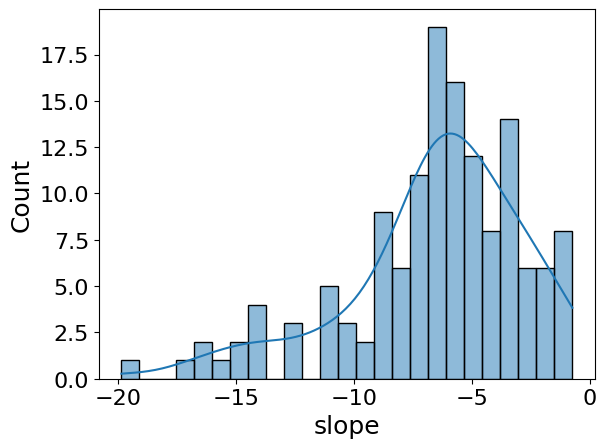

In [149]:
sns.histplot(central_ov25_5021[central_ov25_5021['slope_p_fdr'] < 0.05]["slope"], kde=True, bins=25)

plt.show()

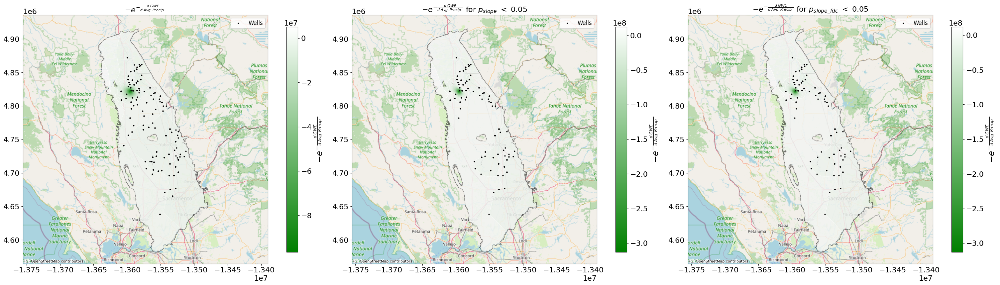

In [64]:
plt.rcParams.update({
    'font.size': 14,
    'axes.titlesize': 26,
    'axes.labelsize': 18,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
    'legend.fontsize': 16,
    'figure.titlesize': 32
})

filtered_gdf = gdf[gdf['Basin_Numb'] == '5-021']
larger_polygon = filtered_gdf.dissolve().geometry.iloc[0]
larger_polygon_gdf = gpd.GeoDataFrame(geometry=[larger_polygon], crs=filtered_gdf.crs)
larger_polygon_gdf = larger_polygon_gdf.to_crs(epsg=32633)
bounds = larger_polygon_gdf.total_bounds

grid_x = np.linspace(bounds[0], bounds[2], num=100)
grid_y = np.linspace(bounds[1], bounds[3], num=100)

transformer = Transformer.from_crs("EPSG:32633", "EPSG:3857", always_xy=True)
colors = ["green", "white"]

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 10), constrained_layout=True)

#############################################
# LEFT PANEL: Original Slope Interpolation  #
#############################################

wells_gdf = gpd.GeoDataFrame(
    central_ov25_5021,
    geometry=gpd.points_from_xy(central_ov25_5021['longitude'], central_ov25_5021['latitude']),
    crs="EPSG:4326"
).to_crs(larger_polygon_gdf.crs)

x = wells_gdf.geometry.x
y = wells_gdf.geometry.y
z_slope = -np.exp(-wells_gdf['slope'])

ok_slope = OrdinaryKriging(x, y, z_slope, variogram_model='linear')
z_interp_slope, ss_slope = ok_slope.execute('grid', grid_x, grid_y)
xx, yy = np.meshgrid(grid_x, grid_y)

grid_points = np.vstack((xx.flatten(), yy.flatten())).T
grid_points_gdf = gpd.GeoSeries(
    gpd.points_from_xy(grid_points[:, 0], grid_points[:, 1]),
    crs=larger_polygon_gdf.crs
)
mask = grid_points_gdf.within(larger_polygon_gdf.geometry.iloc[0]).values.reshape(xx.shape)
z_interp_masked_slope = np.ma.masked_where(~mask, z_interp_slope)

slope_vals = z_interp_masked_slope.compressed()
min_val = slope_vals.min()
max_val = slope_vals.max()
norm = mpl.colors.TwoSlopeNorm(vmin=min_val, vcenter=(min_val+max_val)/2, vmax=max_val)
cmap = mpl.colors.LinearSegmentedColormap.from_list("brown_white_green", colors)

larger_polygon_3857 = larger_polygon_gdf.to_crs(epsg=3857)
wells_gdf_3857 = wells_gdf.to_crs(epsg=3857)
xx_3857, yy_3857 = transformer.transform(xx, yy)

larger_polygon_3857.plot(ax=ax1, color='lightgray', edgecolor='black', alpha=0.5)
ax1.contourf(xx_3857, yy_3857, z_interp_masked_slope, levels=50, cmap=cmap, norm=norm, alpha=0.7)
wells_gdf_3857.plot(ax=ax1, marker='.', color='black', markersize=15, label='Wells')
ctx.add_basemap(ax1, crs=larger_polygon_3857.crs, source=ctx.providers.OpenStreetMap.Mapnik)
ax1.set_title(r"$-e^{-\frac{d\ GWE}{d\ Avg. Precip.}}$", fontsize=16)
ax1.set_aspect('equal')
ax1.legend(fontsize=12)
sm1 = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm1.set_array([])
cbar1 = fig.colorbar(sm1, ax=ax1, fraction=0.046, pad=0.04)
cbar1.set_label(r"$-e^{-\frac{d\ GWE}{d\ Avg. Precip.}}$", fontsize=18)

######################################################
# MIDDLE PANEL: Log Transform (p-value < 0.05 Filter)  #
######################################################

filtered_points = central_ov25_5021[central_ov25_5021['slope_p_value'] < 0.05]
wells_gdf_sig = gpd.GeoDataFrame(
    filtered_points,
    geometry=gpd.points_from_xy(filtered_points['longitude'], filtered_points['latitude']),
    crs="EPSG:4326"
).to_crs(larger_polygon_gdf.crs)

x_sig = wells_gdf_sig.geometry.x
y_sig = wells_gdf_sig.geometry.y
z_slope_sig = -np.exp(-wells_gdf_sig['slope'])

ok_slope_sig = OrdinaryKriging(x_sig, y_sig, z_slope_sig, variogram_model='linear')
z_interp_slope_sig, ss_slope_sig = ok_slope_sig.execute('grid', grid_x, grid_y)
xx_sig, yy_sig = np.meshgrid(grid_x, grid_y)

grid_points_sig = np.vstack((xx_sig.flatten(), yy_sig.flatten())).T
grid_points_gdf_sig = gpd.GeoSeries(
    gpd.points_from_xy(grid_points_sig[:, 0], grid_points_sig[:, 1]),
    crs=larger_polygon_gdf.crs
)
mask_sig = grid_points_gdf_sig.within(larger_polygon_gdf.geometry.iloc[0]).values.reshape(xx_sig.shape)
z_interp_masked_slope_sig = np.ma.masked_where(~mask_sig, z_interp_slope_sig)

slope_vals_sig = z_interp_masked_slope_sig.compressed()
min_val_sig = slope_vals_sig.min()
max_val_sig = slope_vals_sig.max()
norm_sig = mpl.colors.TwoSlopeNorm(vmin=min_val_sig, vcenter=(min_val_sig+max_val_sig)/2, vmax=max_val_sig)
cmap_sig = mpl.colors.LinearSegmentedColormap.from_list("brown_white_green", colors)

larger_polygon_3857_sig = larger_polygon_gdf.to_crs(epsg=3857)
wells_gdf_3857_sig = wells_gdf_sig.to_crs(epsg=3857)
xx_3857_sig, yy_3857_sig = transformer.transform(xx_sig, yy_sig)

larger_polygon_3857_sig.plot(ax=ax2, color='lightgray', edgecolor='black', alpha=0.5)
ax2.contourf(xx_3857_sig, yy_3857_sig, z_interp_masked_slope_sig, levels=50, cmap=cmap_sig, norm=norm_sig, alpha=0.7)
wells_gdf_3857_sig.plot(ax=ax2, marker='.', color='black', markersize=15, label='Wells')
ctx.add_basemap(ax2, crs=larger_polygon_3857_sig.crs, source=ctx.providers.OpenStreetMap.Mapnik)
ax2.set_title(r"$-e^{-\frac{d\ GWE}{d\ Avg. Precip.}}$ for $p_{slope}\ <\ 0.05$", fontsize=16)
ax2.set_aspect('equal')
ax2.legend(fontsize=12)
sm2 = mpl.cm.ScalarMappable(norm=norm_sig, cmap=cmap_sig)
sm2.set_array([])
cbar2 = fig.colorbar(sm2, ax=ax2, fraction=0.046, pad=0.04)
cbar2.set_label(r"$-e^{-\frac{d\ GWE}{d\ Avg. Precip.}}$", fontsize=18)

###################################################################
# RIGHT PANEL: Log Transform (p_fdr < 0.05 Filter) – Third Plot    #
###################################################################

filtered_points_fdr = central_ov25_5021[central_ov25_5021['slope_p_fdr'] < 0.05]
wells_gdf_fdr = gpd.GeoDataFrame(
    filtered_points_fdr,
    geometry=gpd.points_from_xy(filtered_points_fdr['longitude'], filtered_points_fdr['latitude']),
    crs="EPSG:4326"
).to_crs(larger_polygon_gdf.crs)

x_fdr = wells_gdf_fdr.geometry.x
y_fdr = wells_gdf_fdr.geometry.y
z_slope_fdr = -np.exp(-wells_gdf_fdr['slope'])

ok_slope_fdr = OrdinaryKriging(x_fdr, y_fdr, z_slope_fdr, variogram_model='linear')
z_interp_slope_fdr, ss_slope_fdr = ok_slope_fdr.execute('grid', grid_x, grid_y)
xx_fdr, yy_fdr = np.meshgrid(grid_x, grid_y)

grid_points_fdr = np.vstack((xx_fdr.flatten(), yy_fdr.flatten())).T
grid_points_gdf_fdr = gpd.GeoSeries(
    gpd.points_from_xy(grid_points_fdr[:, 0], grid_points_fdr[:, 1]),
    crs=larger_polygon_gdf.crs
)
mask_fdr = grid_points_gdf_fdr.within(larger_polygon_gdf.geometry.iloc[0]).values.reshape(xx_fdr.shape)
z_interp_masked_slope_fdr = np.ma.masked_where(~mask_fdr, z_interp_slope_fdr)

slope_vals_fdr = z_interp_masked_slope_fdr.compressed()
min_val_fdr = slope_vals_fdr.min()
max_val_fdr = slope_vals_fdr.max()
norm_fdr = mpl.colors.TwoSlopeNorm(vmin=min_val_fdr, vcenter=(min_val_fdr+max_val_fdr)/2, vmax=max_val_fdr)
cmap_fdr = mpl.colors.LinearSegmentedColormap.from_list("brown_white_green", colors)

larger_polygon_3857_fdr = larger_polygon_gdf.to_crs(epsg=3857)
wells_gdf_3857_fdr = wells_gdf_fdr.to_crs(epsg=3857)
xx_3857_fdr, yy_3857_fdr = transformer.transform(xx_fdr, yy_fdr)

larger_polygon_3857_fdr.plot(ax=ax3, color='lightgray', edgecolor='black', alpha=0.5)
ax3.contourf(xx_3857_fdr, yy_3857_fdr, z_interp_masked_slope_fdr, levels=50, cmap=cmap_fdr, norm=norm_fdr, alpha=0.7)
wells_gdf_3857_fdr.plot(ax=ax3, marker='.', color='black', markersize=15, label='Wells')
ctx.add_basemap(ax3, crs=larger_polygon_3857_fdr.crs, source=ctx.providers.OpenStreetMap.Mapnik)
ax3.set_title(r"$-e^{-\frac{d\ GWE}{d\ Avg. Precip.}}$ for $p_{slope\_fdc}\ <\ 0.05$", fontsize=16)
ax3.set_aspect('equal')
ax3.legend(fontsize=12)
sm3 = mpl.cm.ScalarMappable(norm=norm_fdr, cmap=cmap_fdr)
sm3.set_array([])
cbar3 = fig.colorbar(sm3, ax=ax3, fraction=0.046, pad=0.04)
cbar3.set_label(r"$-e^{-\frac{d\ GWE}{d\ Avg. Precip.}}$", fontsize=18)

plt.show()

In [65]:
df_surfaces['slope'] = np.ma.filled(z_interp_masked_slope, np.nan).flatten()
df_surfaces['slope_sig'] = np.ma.filled(z_interp_masked_slope_sig, np.nan).flatten()
df_surfaces['slope_fdr'] = np.ma.filled(z_interp_masked_slope_fdr, np.nan).flatten()

In [88]:
transformer_latlon = Transformer.from_crs("EPSG:32633", "EPSG:4326", always_xy=True)
lon, lat = transformer_latlon.transform(xx.flatten(), yy.flatten())

# Create the base DataFrame including your interpolated surfaces and grid coordinates (in EPSG:32633)
df_surfaces = pd.DataFrame({
    'x': xx.flatten(),  # grid x in EPSG:32633
    'y': yy.flatten(),  # grid y in EPSG:32633
    'longitude': lon,
    'latitude': lat,
    'dry_avg_gwe': np.ma.filled(z_interp_masked_dry, np.nan).flatten(),
    'wet_avg_gwe': np.ma.filled(z_interp_masked_wet, np.nan).flatten(),
    'diff_gwe': np.ma.filled(z_interp_masked_diff, np.nan).flatten(),
    'slope': np.ma.filled(z_interp_masked_slope, np.nan).flatten(),
    'slope_sig': np.ma.filled(z_interp_masked_slope_sig, np.nan).flatten(),
    'slope_fdr': np.ma.filled(z_interp_masked_slope_fdr, np.nan).flatten()
})

# Create a GeoDataFrame from df_surfaces using the x and y columns
grid_gdf = gpd.GeoDataFrame(
    df_surfaces.copy(),
    geometry=gpd.points_from_xy(df_surfaces['x'], df_surfaces['y']),
    crs="EPSG:32633"
)

# Give each grid point a unique identifier
grid_gdf = grid_gdf.reset_index().rename(columns={'index': 'grid_idx'})

# ------------------------------
# 2. Assign each well to the nearest grid point
# ------------------------------
# Make sure wells_gdf is in the same CRS (EPSG:32633)
wells_proj = wells_gdf.to_crs(epsg=32633)

# Use a spatial join based on nearest neighbor.
# Note: geopandas.sjoin_nearest requires geopandas >= 0.10.
wells_nearest = gpd.sjoin_nearest(
    wells_proj, 
    grid_gdf[['grid_idx', 'geometry']], 
    how="left", 
    distance_col="distance"
)

# ------------------------------
# 3. Aggregate well slope values for each grid point
# ------------------------------
# Group by grid_idx (from the grid_gdf) and calculate the average and median of the actual well 'slope'
agg_slopes = wells_nearest.groupby('grid_idx')['slope'].agg(
    actual_slope_avg='mean',
    actual_slope_med='median'
).reset_index()

# ------------------------------
# 4. Merge the aggregated values back to df_surfaces
# ------------------------------
# Merge the aggregated slopes with grid_gdf (preserving all grid points)
grid_gdf = grid_gdf.merge(agg_slopes, on='grid_idx', how='left')

# Now update the original df_surfaces by adding the new columns.
# Since grid_gdf has the same row order as df_surfaces, we can assign directly.
df_surfaces['actual_slope_avg'] = grid_gdf['actual_slope_avg']
df_surfaces['actual_slope_med'] = grid_gdf['actual_slope_med']

In [89]:
len(df_surfaces[~df_surfaces.actual_slope_avg.isna()])

107

In [99]:
surfaces_5021 = df_surfaces[~df_surfaces.dry_avg_gwe.isna()].copy()

In [100]:
surfaces_5021.drop(columns=["x", "y"], inplace=True)

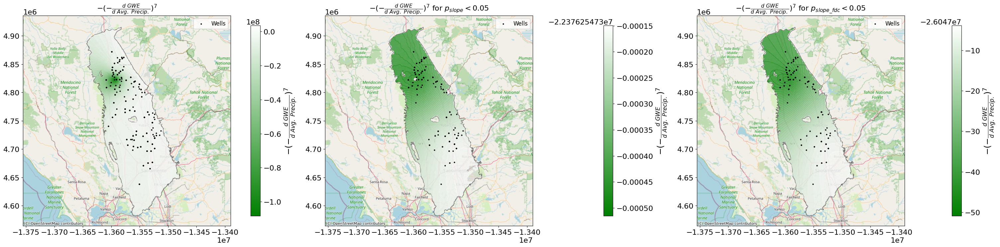

In [163]:
plt.rcParams.update({
    'font.size': 14,
    'axes.titlesize': 26,
    'axes.labelsize': 18,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
    'legend.fontsize': 16,
    'figure.titlesize': 32
})

filtered_gdf = gdf[gdf['Basin_Numb'] == '5-021']
larger_polygon = filtered_gdf.dissolve().geometry.iloc[0]
larger_polygon_gdf = gpd.GeoDataFrame(geometry=[larger_polygon], crs=filtered_gdf.crs)
larger_polygon_gdf = larger_polygon_gdf.to_crs(epsg=32633)
bounds = larger_polygon_gdf.total_bounds

grid_x = np.linspace(bounds[0], bounds[2], num=100)
grid_y = np.linspace(bounds[1], bounds[3], num=100)

transformer = Transformer.from_crs("EPSG:32633", "EPSG:3857", always_xy=True)
colors = ["green", "white"]

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 10), constrained_layout=True)

#############################################
# LEFT PANEL: Original Slope Interpolation  #
#############################################

wells_gdf = gpd.GeoDataFrame(
    central_ov25_5021,
    geometry=gpd.points_from_xy(central_ov25_5021['longitude'], central_ov25_5021['latitude']),
    crs="EPSG:4326"
).to_crs(larger_polygon_gdf.crs)

x = wells_gdf.geometry.x
y = wells_gdf.geometry.y
z_slope = -(-wells_gdf['slope'] ** 7)

ok_slope = OrdinaryKriging(x, y, z_slope, variogram_model='linear')
z_interp_slope, ss_slope = ok_slope.execute('grid', grid_x, grid_y)
xx, yy = np.meshgrid(grid_x, grid_y)

grid_points = np.vstack((xx.flatten(), yy.flatten())).T
grid_points_gdf = gpd.GeoSeries(
    gpd.points_from_xy(grid_points[:, 0], grid_points[:, 1]),
    crs=larger_polygon_gdf.crs
)
mask = grid_points_gdf.within(larger_polygon_gdf.geometry.iloc[0]).values.reshape(xx.shape)
z_interp_masked_slope = np.ma.masked_where(~mask, z_interp_slope)

slope_vals = z_interp_masked_slope.compressed()
min_val = slope_vals.min()
max_val = slope_vals.max()
norm = mpl.colors.TwoSlopeNorm(vmin=min_val, vcenter=(min_val+max_val)/2, vmax=max_val)
cmap = mpl.colors.LinearSegmentedColormap.from_list("brown_white_green", colors)

larger_polygon_3857 = larger_polygon_gdf.to_crs(epsg=3857)
wells_gdf_3857 = wells_gdf.to_crs(epsg=3857)
xx_3857, yy_3857 = transformer.transform(xx, yy)

larger_polygon_3857.plot(ax=ax1, color='lightgray', edgecolor='black', alpha=0.5)
ax1.contourf(xx_3857, yy_3857, z_interp_masked_slope, levels=50, cmap=cmap, norm=norm, alpha=0.7)
wells_gdf_3857.plot(ax=ax1, marker='.', color='black', markersize=15, label='Wells')
ctx.add_basemap(ax1, crs=larger_polygon_3857.crs, source=ctx.providers.OpenStreetMap.Mapnik)
ax1.set_title(r"$-(-\frac{d\ GWE}{d\ Avg.\ Precip.})^7$", fontsize=16)
ax1.set_aspect('equal')
ax1.legend(fontsize=12)
sm1 = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm1.set_array([])
cbar1 = fig.colorbar(sm1, ax=ax1, fraction=0.046, pad=0.04)
cbar1.set_label(r"$-(-\frac{d\ GWE}{d\ Avg.\ Precip.})^7$", fontsize=18)

######################################################
# MIDDLE PANEL: Log Transform (p-value < 0.05 Filter)  #
######################################################

filtered_points = central_ov25_5021[central_ov25_5021['slope_p_value'] < 0.05]
wells_gdf_sig = gpd.GeoDataFrame(
    filtered_points,
    geometry=gpd.points_from_xy(filtered_points['longitude'], filtered_points['latitude']),
    crs="EPSG:4326"
).to_crs(larger_polygon_gdf.crs)

x_sig = wells_gdf_sig.geometry.x
y_sig = wells_gdf_sig.geometry.y
z_slope_sig = -(-wells_gdf_sig['slope'] ** 7)

ok_slope_sig = OrdinaryKriging(x_sig, y_sig, z_slope_sig, variogram_model='linear')
z_interp_slope_sig, ss_slope_sig = ok_slope_sig.execute('grid', grid_x, grid_y)
xx_sig, yy_sig = np.meshgrid(grid_x, grid_y)

grid_points_sig = np.vstack((xx_sig.flatten(), yy_sig.flatten())).T
grid_points_gdf_sig = gpd.GeoSeries(
    gpd.points_from_xy(grid_points_sig[:, 0], grid_points_sig[:, 1]),
    crs=larger_polygon_gdf.crs
)
mask_sig = grid_points_gdf_sig.within(larger_polygon_gdf.geometry.iloc[0]).values.reshape(xx_sig.shape)
z_interp_masked_slope_sig = np.ma.masked_where(~mask_sig, z_interp_slope_sig)

slope_vals_sig = z_interp_masked_slope_sig.compressed()
min_val_sig = slope_vals_sig.min()
max_val_sig = slope_vals_sig.max()
norm_sig = mpl.colors.TwoSlopeNorm(vmin=min_val_sig, vcenter=(min_val_sig+max_val_sig)/2, vmax=max_val_sig)
cmap_sig = mpl.colors.LinearSegmentedColormap.from_list("brown_white_green", colors)

larger_polygon_3857_sig = larger_polygon_gdf.to_crs(epsg=3857)
wells_gdf_3857_sig = wells_gdf_sig.to_crs(epsg=3857)
xx_3857_sig, yy_3857_sig = transformer.transform(xx_sig, yy_sig)

larger_polygon_3857_sig.plot(ax=ax2, color='lightgray', edgecolor='black', alpha=0.5)
ax2.contourf(xx_3857_sig, yy_3857_sig, z_interp_masked_slope_sig, levels=50, cmap=cmap_sig, norm=norm_sig, alpha=0.7)
wells_gdf_3857_sig.plot(ax=ax2, marker='.', color='black', markersize=15, label='Wells')
ctx.add_basemap(ax2, crs=larger_polygon_3857_sig.crs, source=ctx.providers.OpenStreetMap.Mapnik)
ax2.set_title(r"$-(-\frac{d\ GWE}{d\ Avg.\ Precip.})^7$ for $p_{slope} < 0.05$", fontsize=16)
ax2.set_aspect('equal')
ax2.legend(fontsize=12)
sm2 = mpl.cm.ScalarMappable(norm=norm_sig, cmap=cmap_sig)
sm2.set_array([])
cbar2 = fig.colorbar(sm2, ax=ax2, fraction=0.046, pad=0.04)
cbar2.set_label(r"$-(-\frac{d\ GWE}{d\ Avg.\ Precip.})^7$", fontsize=18)

###################################################################
# RIGHT PANEL: Log Transform (p_fdr < 0.05 Filter) – Third Plot    #
###################################################################

filtered_points_fdr = central_ov25_5021[central_ov25_5021['slope_p_fdr'] < 0.05]
wells_gdf_fdr = gpd.GeoDataFrame(
    filtered_points_fdr,
    geometry=gpd.points_from_xy(filtered_points_fdr['longitude'], filtered_points_fdr['latitude']),
    crs="EPSG:4326"
).to_crs(larger_polygon_gdf.crs)

x_fdr = wells_gdf_fdr.geometry.x
y_fdr = wells_gdf_fdr.geometry.y
z_slope_fdr = -(-wells_gdf_fdr['slope'] ** 7)

ok_slope_fdr = OrdinaryKriging(x_fdr, y_fdr, z_slope_fdr, variogram_model='linear')
z_interp_slope_fdr, ss_slope_fdr = ok_slope_fdr.execute('grid', grid_x, grid_y)
xx_fdr, yy_fdr = np.meshgrid(grid_x, grid_y)

grid_points_fdr = np.vstack((xx_fdr.flatten(), yy_fdr.flatten())).T
grid_points_gdf_fdr = gpd.GeoSeries(
    gpd.points_from_xy(grid_points_fdr[:, 0], grid_points_fdr[:, 1]),
    crs=larger_polygon_gdf.crs
)
mask_fdr = grid_points_gdf_fdr.within(larger_polygon_gdf.geometry.iloc[0]).values.reshape(xx_fdr.shape)
z_interp_masked_slope_fdr = np.ma.masked_where(~mask_fdr, z_interp_slope_fdr)

slope_vals_fdr = z_interp_masked_slope_fdr.compressed()
min_val_fdr = slope_vals_fdr.min()
max_val_fdr = slope_vals_fdr.max()
norm_fdr = mpl.colors.TwoSlopeNorm(vmin=min_val_fdr, vcenter=(min_val_fdr+max_val_fdr)/2, vmax=max_val_fdr)
cmap_fdr = mpl.colors.LinearSegmentedColormap.from_list("brown_white_green", colors)

larger_polygon_3857_fdr = larger_polygon_gdf.to_crs(epsg=3857)
wells_gdf_3857_fdr = wells_gdf_fdr.to_crs(epsg=3857)
xx_3857_fdr, yy_3857_fdr = transformer.transform(xx_fdr, yy_fdr)

larger_polygon_3857_fdr.plot(ax=ax3, color='lightgray', edgecolor='black', alpha=0.5)
ax3.contourf(xx_3857_fdr, yy_3857_fdr, z_interp_masked_slope_fdr, levels=50, cmap=cmap_fdr, norm=norm_fdr, alpha=0.7)
wells_gdf_3857_fdr.plot(ax=ax3, marker='.', color='black', markersize=15, label='Wells')
ctx.add_basemap(ax3, crs=larger_polygon_3857_fdr.crs, source=ctx.providers.OpenStreetMap.Mapnik)
ax3.set_title(r"$-(-\frac{d\ GWE}{d\ Avg.\ Precip.})^7$ for $p_{slope\_fdc} < 0.05$", fontsize=16)
ax3.set_aspect('equal')
ax3.legend(fontsize=12)
sm3 = mpl.cm.ScalarMappable(norm=norm_fdr, cmap=cmap_fdr)
sm3.set_array([])
cbar3 = fig.colorbar(sm3, ax=ax3, fraction=0.046, pad=0.04)
cbar3.set_label(r"$-(-\frac{d\ GWE}{d\ Avg.\ Precip.})^7$", fontsize=18)

plt.show()